In [557]:
from urllib.request import urlopen
from bs4 import BeautifulSoup
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn import linear_model
from sklearn.svm import SVR
from sklearn import neighbors
from sklearn.model_selection import cross_val_score
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from operator import itemgetter

# Web Scraping

First I'm going to scrape in my data from the website www.basketball-reference.com.  I'm using the advanced stats page back through 2014.  I'm pulling in all the data at first, and I plan on cutting it down over time.  I had some issue with the loop I'm running.  I was able to pull the data each year relatively well, but couldn't combine it into a single data frame easily.

In [415]:
def scrape_NBA_team_data(years = [2014, 2015, 2016, 2017, 2018, 2019, 2020, 2021]):
    #final_df = pd.DataFrame(columns = ['Year','Player','Pos','Age','Tm','G','MP','PER', 'TS%','3PAr','FTr','ORB%','DRB%',
          #'TRB%','AST%','STL%','BLK%','TOV%','USG%','OWS','DWS','WS','WS/48','OBPM','DBPM','BPM','VORP'])
    for y in years:
        year = y
        url = f"https://www.basketball-reference.com/leagues/NBA_{year}_advanced.html"
        html = urlopen(url)
        soup = BeautifulSoup(html, features="lxml")
        headers = [th.getText() for th in soup.findAll('tr', limit=1)[0].findAll('th')[1:]]
        #headers.remove('\xa0')
        rows = soup.findAll('tr')[1:]
        rows_data = [[td.getText() for td in rows[i].findAll('td')]
                    for i in range(len(rows))]
        for i in range(0, len(rows_data)):
            rows_data[i].insert(0, year)
        headers.insert(0, "Year")
        year_data = pd.DataFrame(rows_data, columns = headers)
        #final_df = final_df.append(year_data)
        return pd.DataFrame(year_data)
        #year_data.to_csv("nba_team_data.csv", index=False)

As a kind of simple end around, I just pulled in each individual data set via the function above and then used the pd.concat function to merge them into a single dataset.

In [426]:
a = scrape_NBA_team_data(years = [2021])
b = scrape_NBA_team_data(years = [2020])
c = scrape_NBA_team_data(years = [2019])
d = scrape_NBA_team_data(years = [2018])
e = scrape_NBA_team_data(years = [2017])
f = scrape_NBA_team_data(years = [2016])
g = scrape_NBA_team_data(years = [2015])
h = scrape_NBA_team_data(years = [2014])
frames = [a, b, c, d, e, f, g, h]
union = pd.concat(frames)
union.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5362 entries, 0 to 634
Data columns (total 29 columns):
 #   Column  Non-Null Count  Dtype 
---  ------  --------------  ----- 
 0   Year    5362 non-null   int64 
 1   Player  5163 non-null   object
 2   Pos     5163 non-null   object
 3   Age     5163 non-null   object
 4   Tm      5163 non-null   object
 5   G       5163 non-null   object
 6   MP      5163 non-null   object
 7   PER     5163 non-null   object
 8   TS%     5163 non-null   object
 9   3PAr    5163 non-null   object
 10  FTr     5163 non-null   object
 11  ORB%    5163 non-null   object
 12  DRB%    5163 non-null   object
 13  TRB%    5163 non-null   object
 14  AST%    5163 non-null   object
 15  STL%    5163 non-null   object
 16  BLK%    5163 non-null   object
 17  TOV%    5163 non-null   object
 18  USG%    5163 non-null   object
 19          5163 non-null   object
 20  OWS     5163 non-null   object
 21  DWS     5163 non-null   object
 22  WS      5163 non-null   o

As you can see, I do have some blanks in the data.  There appear to be empty rows (Year has 5362 records while the rest have 5163).  There are also appear to be two empty columsn (19 and 24).

In [1282]:
data_set = pd.DataFrame(union)

So I'm going to deal with the empty columns and the empty rows.

In [430]:
data_set.replace('None', np.nan, inplace=True)

In [431]:
data_set.dropna(inplace = True)

In [435]:
data_set.replace('', np.nan, inplace=True)

It looks like the data has been cleaned and there are only 5163 records.  In addition, I convert the data from objects to floats.

In [441]:
data_set.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5163 entries, 0 to 634
Data columns (total 27 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Year    5163 non-null   int64  
 1   Player  5163 non-null   object 
 2   Pos     5163 non-null   object 
 3   Age     5163 non-null   float64
 4   Tm      5163 non-null   object 
 5   G       5163 non-null   float64
 6   MP      5163 non-null   float64
 7   PER     5163 non-null   float64
 8   TS%     5135 non-null   float64
 9   3PAr    5135 non-null   float64
 10  FTr     5135 non-null   float64
 11  ORB%    5163 non-null   float64
 12  DRB%    5163 non-null   float64
 13  TRB%    5163 non-null   float64
 14  AST%    5163 non-null   float64
 15  STL%    5163 non-null   float64
 16  BLK%    5163 non-null   float64
 17  TOV%    5139 non-null   float64
 18  USG%    5163 non-null   float64
 19  OWS     5163 non-null   float64
 20  DWS     5163 non-null   float64
 21  WS      5163 non-null   float64
 22  W

In [437]:
data_set.dropna(how='all', axis=1, inplace=True)

In [440]:
data_set[["Age","G","MP", "PER", "TS%", "3PAr", "FTr", "ORB%", "DRB%", "TRB%", "AST%",
  "STL%", "BLK%", "TOV%", "USG%", "OWS", "DWS", "WS", "WS/48", "OBPM", "DBPM", "BPM", "VORP"]] = data_set[["Age","G","MP", "PER", "TS%", "3PAr", "FTr", "ORB%", "DRB%", "TRB%", "AST%",
   "STL%", "BLK%", "TOV%", "USG%", "OWS", "DWS", "WS", "WS/48", "OBPM", "DBPM", "BPM", "VORP"]].apply(pd.to_numeric, axis =1)

# Exploratory Data Analysis

So now I'm just beginning to explore the data, looking at some different aggregate functions first.  

In [329]:
data_set.groupby(["Year", "Pos"]).agg({"WS":["mean", "max", "min"],"OBPM":["mean", "max", "min"],"DBPM":["mean", "max", "min"] })

WS                 OBPM                 DBPM            
                mean   max  min      mean  max   min      mean   max   min
Year Pos                                                                  
2014 C      2.367568  11.2 -0.1 -2.246847  4.0 -14.1 -0.090090   5.8 -26.1
     PF     2.713333  15.9 -0.4 -1.773333  8.3 -14.8 -0.174167   3.4  -4.5
     PF-SF  1.000000   1.0  1.0 -3.000000 -3.0  -3.0  0.200000   0.2   0.2
     PG     2.309735  13.4 -0.9 -1.175221  6.3 -12.0 -0.333628  13.4  -6.6
     SF     1.960769  19.2 -0.2 -1.598462  9.0 -31.4 -0.116923   3.7 -15.6
...              ...   ...  ...       ...  ...   ...       ...   ...   ...
2021 SF-PF  0.525000   1.3 -0.1 -3.375000  0.0  -7.0  0.150000   2.5  -0.9
     SF-SG  1.550000   2.8  0.3 -0.350000  1.2  -1.9 -0.550000  -0.2  -0.9
     SG     1.293210   5.9 -0.5 -1.864815  5.6 -13.6 -0.780247   4.3  -4.2
     SG-PG  1.933333   4.3  0.4 -1.466667  0.7  -2.9  0.633333   1.5  -0.9
     SG-SF  3.150000   4.7  1.6 -0.700000  0.8  -2.2 -0.400000  -0.1  -0.7

[77 rows x 9 columns]

I want to get a sense of the correlations between the different variables in the data set so I run a heatmap of the correlations.

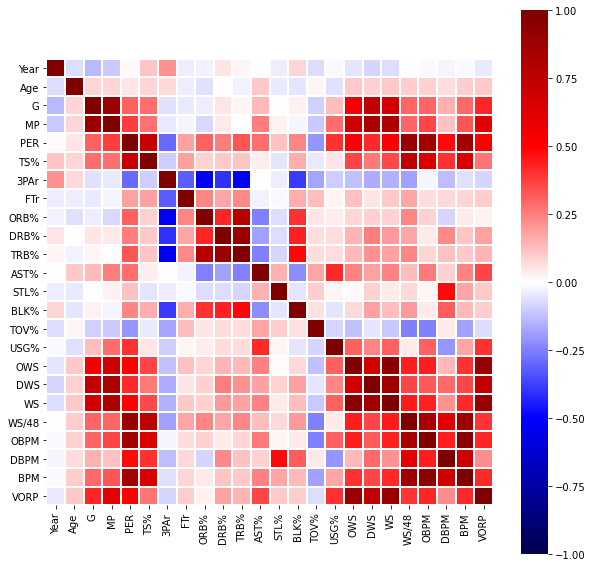

In [442]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(data_set.corr(), linewidth=1, linecolor='w', square=True, cmap="seismic", vmin=-1, vmax=1, ax=ax);

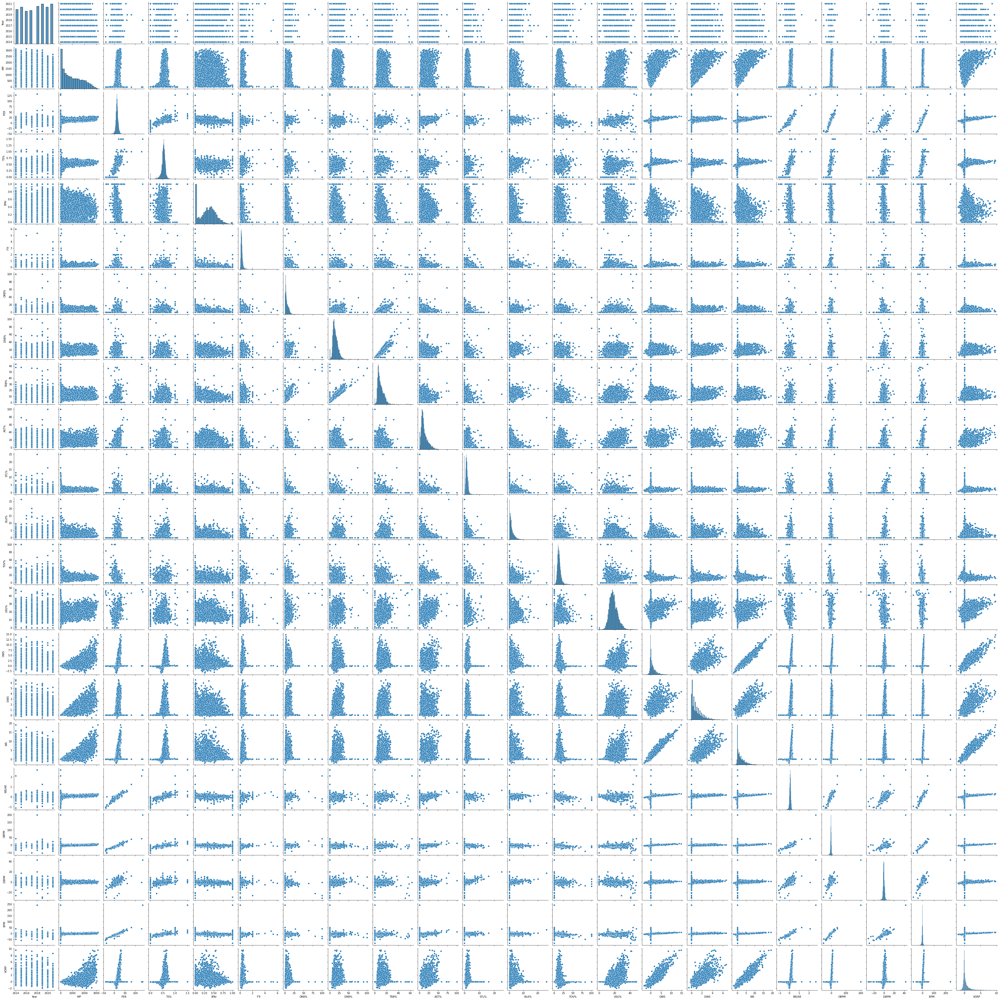

In [336]:
sns.set_theme(color_codes=True)
sns.pairplot(data_set);

Since I'm interested in Win Share (at least initially), I wanted to drill down deeper to see if there's a linear relationship between any of the variables.  It does appear that some have stronger linear relationships than others.  But it also looks like there maybe some noise in the data (e.g. there's a large subset of the data with a winshare of 0).  So I think I may need to put in some filters to minimize some of the impact of the noise.

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/anaconda3/lib/pyt

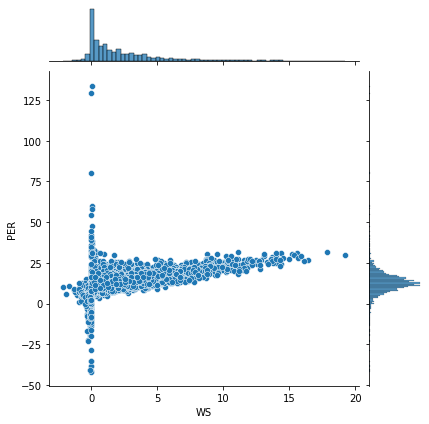

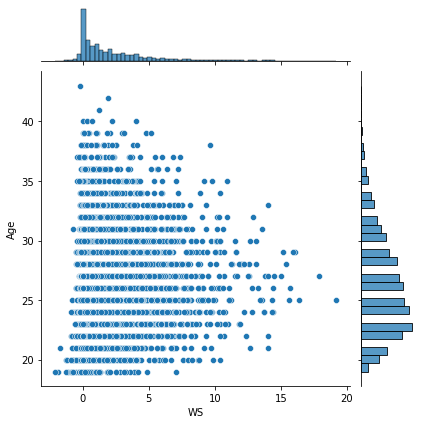

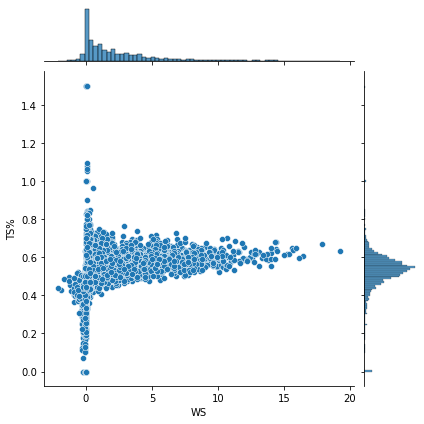

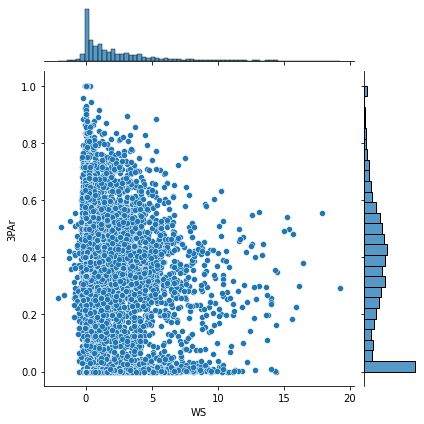

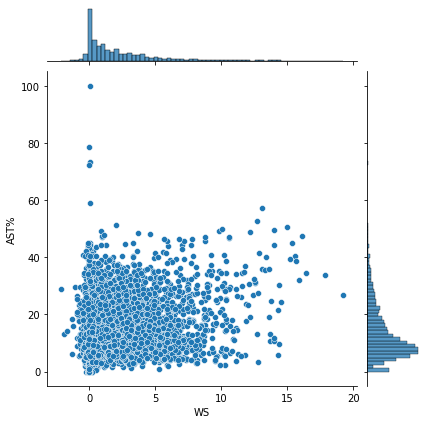

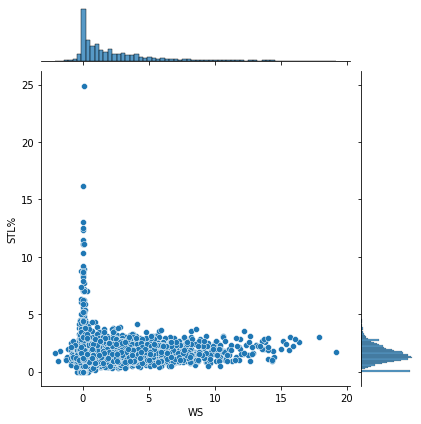

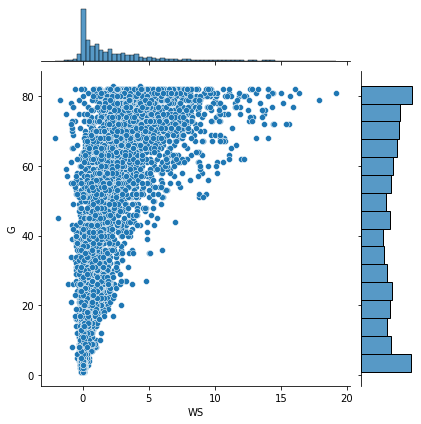

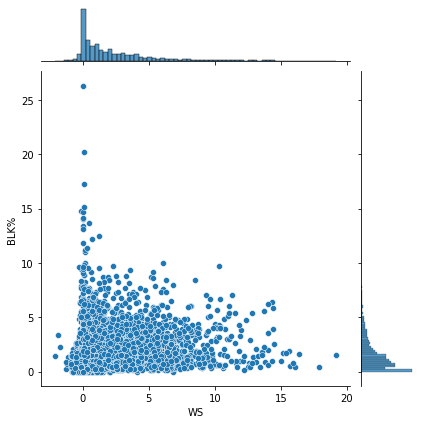

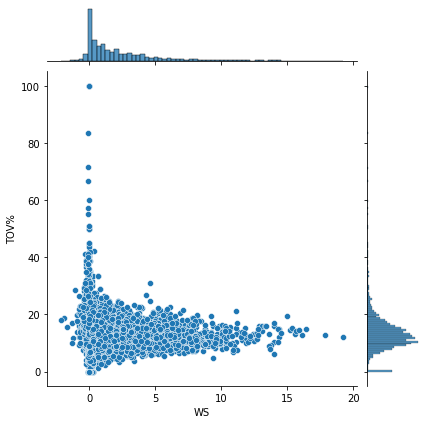

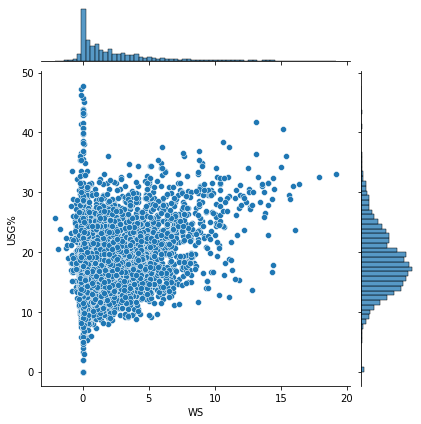

In [443]:
sns.jointplot(data_set.WS, data_set['PER'])
sns.jointplot(data_set.WS, data_set['Age'])
sns.jointplot(data_set.WS, data_set['TS%'])
sns.jointplot(data_set.WS, data_set['3PAr'])
sns.jointplot(data_set.WS, data_set['AST%'])
sns.jointplot(data_set.WS, data_set['STL%'])
sns.jointplot(data_set.WS, data_set['G'])
sns.jointplot(data_set.WS, data_set['BLK%'])
sns.jointplot(data_set.WS, data_set['TOV%'])
sns.jointplot(data_set.WS, data_set['USG%'])

In [343]:
data_set.columns

Index(['Year', 'Player', 'Pos', 'Age', 'Tm', 'G', 'MP', 'PER', 'TS%', '3PAr',
       'FTr', 'ORB%', 'DRB%', 'TRB%', 'AST%', 'STL%', 'BLK%', 'TOV%', 'USG%',
       'OWS', 'DWS', 'WS', 'WS/48', 'OBPM', 'DBPM', 'BPM', 'VORP'],
      dtype='object')

To work with the noise, I set up a data mask to only pull in players that have played at least 30 games.  I tried a few different masks of 10, 20 or 30 games, but 30 seemed like a useful starting point at least for now.  That means the player played in almost 40% of the games for the year.

In [447]:
game_mask = data_set.G >30
nd = data_set[game_mask].reset_index()
nd.head()

,index,Year,Player,Pos,Age,Tm,G,MP,PER,TS%,...,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP
0,0,2021,Precious Achiuwa,PF,21.0,MIA,61.0,737.0,14.2,0.550,...,13.5,19.5,0.3,1.0,1.3,0.085,-3.5,-0.9,-4.5,-0.5
1,2,2021,Steven Adams,C,27.0,NOP,58.0,1605.0,15.1,0.596,...,17.5,11.7,2.3,1.7,4.0,0.119,-0.3,-0.5,-0.8,0.5
2,3,2021,Bam Adebayo,C,23.0,MIA,64.0,2143.0,22.7,0.626,...,15.0,23.7,5.6,3.2,8.8,0.197,2.9,1.9,4.7,3.6
3,8,2021,Nickeil Alexander-Walker,SG,22.0,NOP,46.0,1007.0,12.5,0.522,...,12.4,23.2,-0.3,1.0,0.7,0.035,-1.4,-0.2,-1.6,0.1
4,9,2021,Grayson Allen,SG,25.0,MEM,50.0,1259.0,12.8,0.586,...,9.6,16.8,1.5,1.2,2.7,0.101,-0.4,-0.1,-0.5,0.5


I re-run the correlation data to see if there is any change.  Kind of hard to interpret with the amount of variables that I'm looking at on first glance.

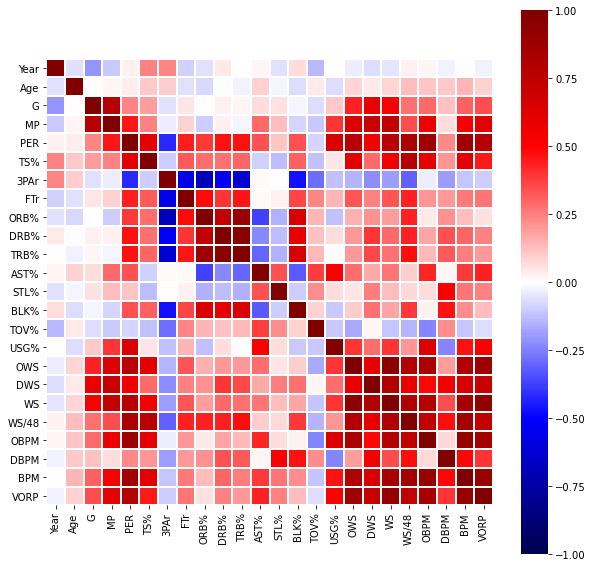

In [445]:
fig, ax = plt.subplots(figsize=(10,10)) 
sns.heatmap(nd.corr(), linewidth=1, linecolor='w', square=True, cmap="seismic", vmin=-1, vmax=1, ax=ax);

Just out of curiosity, wanted to see who led the league in win share.  This is kind of a sanity check to make sure I'm at least running legitimate data.  I should have a reasonable sense that the best players would lead in Win Share.  The first cut is across 2014-2021.  So basically over this time, who was having the best seasons.

In [486]:
nd.sort_values(by=['WS'], ascending = False).head(10)

,index,Year,Player,Pos,Age,Tm,G,MP,PER,TS%,...,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP
3010,191,2014,Kevin Durant,SF,25.0,OKC,81.0,3122.0,29.8,0.635,...,12.2,33.0,14.8,4.4,19.2,0.295,8.8,1.4,10.2,9.6
2140,121,2016,Stephen Curry,PG,27.0,GSW,79.0,2700.0,31.5,0.669,...,12.9,32.6,13.8,4.1,17.9,0.318,10.3,1.6,11.9,9.5
2626,258,2015,James Harden,SG,25.0,HOU,81.0,2981.0,26.7,0.605,...,14.9,31.3,12.2,4.2,16.4,0.265,7.0,1.8,8.8,8.1
2764,465,2015,Chris Paul,PG,29.0,LAC,82.0,2857.0,26.0,0.596,...,12.7,23.7,12.9,3.2,16.1,0.270,6.4,1.6,8.0,7.2
3088,306,2014,LeBron James,PF,29.0,MIA,77.0,2902.0,29.3,0.649,...,14.4,31.0,12.3,3.7,15.9,0.264,7.8,1.1,8.8,7.9
2555,140,2015,Stephen Curry,PG,26.0,GSW,80.0,2613.0,28.0,0.638,...,14.3,28.9,11.5,4.1,15.7,0.288,8.2,1.7,9.9,7.9
198,356,2021,Nikola Jokić,C,25.0,DEN,72.0,2488.0,31.3,0.647,...,13.1,29.6,12.2,3.4,15.6,0.301,9.2,2.5,11.7,8.6
1395,241,2018,James Harden,SG,28.0,HOU,72.0,2551.0,29.8,0.619,...,15.1,36.1,11.6,3.8,15.4,0.289,8.5,1.4,9.9,7.7
969,277,2019,James Harden,PG,29.0,HOU,78.0,2867.0,30.6,0.616,...,14.5,40.5,11.4,3.8,15.2,0.254,9.4,1.6,11.0,9.3
1793,218,2017,James Harden,PG,27.0,HOU,81.0,2947.0,27.4,0.613,...,19.5,34.2,11.5,3.6,15.0,0.245,7.5,1.2,8.7,8.0


Now I'm throwing in an age mask to look at who was leading the league in WS by year.

In [547]:
ym2021 = nd['Year'] == 2021
ym2020 = nd['Year'] == 2020
ym2019 = nd['Year'] == 2019
ym2018 = nd['Year'] == 2018
ym2017 = nd['Year'] == 2017
ym2016 = nd['Year'] == 2016
ym2015 = nd['Year'] == 2015
ym2014 = nd['Year'] == 2014
nd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3293 entries, 0 to 3292
Data columns (total 28 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   index   3293 non-null   int64  
 1   Year    3293 non-null   int64  
 2   Player  3293 non-null   object 
 3   Pos     3293 non-null   object 
 4   Age     3293 non-null   float64
 5   Tm      3293 non-null   object 
 6   G       3293 non-null   float64
 7   MP      3293 non-null   float64
 8   PER     3293 non-null   float64
 9   TS%     3293 non-null   float64
 10  3PAr    3293 non-null   float64
 11  FTr     3293 non-null   float64
 12  ORB%    3293 non-null   float64
 13  DRB%    3293 non-null   float64
 14  TRB%    3293 non-null   float64
 15  AST%    3293 non-null   float64
 16  STL%    3293 non-null   float64
 17  BLK%    3293 non-null   float64
 18  TOV%    3293 non-null   float64
 19  USG%    3293 non-null   float64
 20  OWS     3293 non-null   float64
 21  DWS     3293 non-null   float64
 22  

In [460]:
nd[ym2021].sort_values(by=['WS'], ascending = False).head(5)

,index,Year,Player,Pos,Age,Tm,G,MP,PER,TS%,...,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP
198,356,2021,Nikola Jokić,C,25.0,DEN,72.0,2488.0,31.3,0.647,...,13.1,29.6,12.2,3.4,15.6,0.301,9.2,2.5,11.7,8.6
132,236,2021,Rudy Gobert,C,28.0,UTA,71.0,2187.0,23.5,0.683,...,13.7,17.0,6.1,5.2,11.3,0.248,2.0,2.5,4.5,3.6
229,410,2021,Damian Lillard,PG,30.0,POR,67.0,2398.0,25.6,0.623,...,11.6,31.4,9.6,0.8,10.4,0.209,7.4,-1.6,5.9,4.8
8,17,2021,Giannis Antetokounmpo,PF,26.0,MIL,61.0,2013.0,29.2,0.633,...,13.2,32.5,6.9,3.3,10.2,0.244,6.2,2.6,8.8,5.5
63,110,2021,Jimmy Butler,SF,31.0,MIA,52.0,1745.0,26.5,0.607,...,10.6,26.6,6.6,2.7,9.3,0.255,5.1,2.5,7.5,4.2


In [459]:
nd[ym2020].sort_values(by=['WS'], ascending = False).head(5)

,index,Year,Player,Pos,Age,Tm,G,MP,PER,TS%,...,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP
568,266,2020,James Harden,SG,30.0,HOU,68.0,2483.0,29.1,0.626,...,14.2,36.3,9.9,3.2,13.1,0.254,8.1,1.6,9.6,7.3
641,390,2020,Damian Lillard,PG,29.0,POR,66.0,2474.0,26.9,0.627,...,11.0,30.3,10.9,0.7,11.6,0.225,8.3,-0.9,7.5,5.9
506,168,2020,Anthony Davis,PF,26.0,LAL,62.0,2131.0,27.4,0.610,...,10.4,29.3,6.7,4.4,11.1,0.250,5.4,2.6,8.0,5.4
421,12,2020,Giannis Antetokounmpo,PF,25.0,MIL,63.0,1917.0,31.9,0.613,...,13.2,37.5,6.1,5.0,11.1,0.279,7.4,4.1,11.5,6.6
552,237,2020,Rudy Gobert,C,27.0,UTA,68.0,2333.0,21.7,0.699,...,15.0,16.2,6.5,4.2,10.7,0.221,1.7,1.9,3.6,3.3


In [461]:
nd[ym2019].sort_values(by=['WS'], ascending = False).head(5)

,index,Year,Player,Pos,Age,Tm,G,MP,PER,TS%,...,TOV%,USG%,OWS,DWS,WS,WS/48,OBPM,DBPM,BPM,VORP
969,277,2019,James Harden,PG,29.0,HOU,78.0,2867.0,30.6,0.616,...,14.5,40.5,11.4,3.8,15.2,0.254,9.4,1.6,11.0,9.3
952,253,2019,Rudy Gobert,C,26.0,UTA,81.0,2577.0,24.6,0.682,...,12.1,17.8,8.7,5.7,14.4,0.268,3.0,2.5,5.4,4.8
812,19,2019,Giannis Antetokounmpo,PF,24.0,MIL,72.0,2358.0,30.9,0.644,...,14.8,32.3,8.9,5.5,14.4,0.292,6.3,4.1,10.4,7.4
1056,416,2019,Damian Lillard,PG,28.0,POR,80.0,2838.0,23.7,0.588,...,10.8,29.3,9.7,2.4,12.1,0.205,6.6,-0.3,6.4,6.0
948,249,2019,Paul George,SF,28.0,OKC,77.0,2841.0,23.3,0.583,...,10.0,29.5,7.0,4.9,11.9,0.201,5.6,1.6,7.2,6.6


I wanted to also see if there were an insights to be drawn in the evolution of these stats over time.  So I looked at the means of Win Share, Player Efficiency, Usage, Offensive Win Share and Defensive Win Share.

In [479]:
yearly = nd.groupby("Year").agg({'WS': 'mean', 'PER': 'mean', 'USG%': 'mean', 'OWS':'mean', 'DWS': 'mean'}).reset_index()
yearly.head(10)

,Year,WS,PER,USG%,OWS,DWS
0,2014,3.214963,13.805237,18.866085,1.680798,1.532918
1,2015,3.058974,13.997203,19.036364,1.599301,1.457110
2,2016,3.108600,13.928010,18.963882,1.621622,1.491646
3,2017,3.130676,13.946377,18.959179,1.633333,1.498309
4,2018,3.195761,14.375312,19.046384,1.690025,1.507232
5,2019,2.989522,13.979271,18.852847,1.551253,1.437585
6,2020,2.780412,14.171134,19.004639,1.451546,1.330155
7,2021,2.696135,14.259179,19.048792,1.423188,1.270531


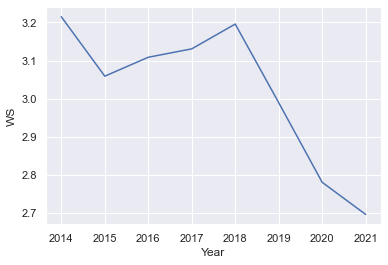

In [473]:
sns.set_theme(color_codes=True)
ax = sns.lineplot(x="Year", y="WS",data=yearly)

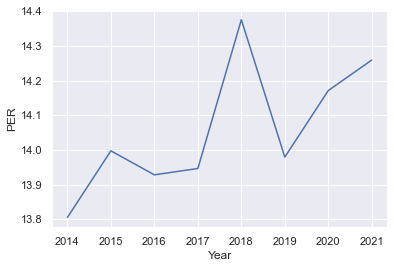

In [474]:
ax1 = sns.lineplot(x="Year", y="PER",data=yearly)

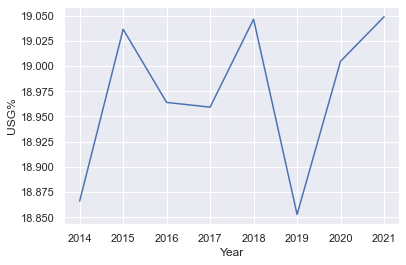

In [480]:
ax2 = sns.lineplot(x="Year", y="USG%",data=yearly)

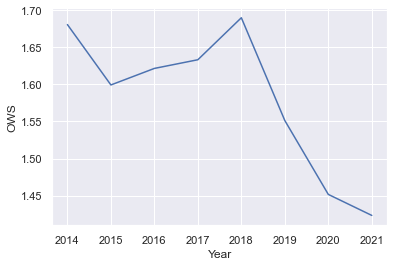

In [481]:
ax3 = sns.lineplot(x="Year", y="OWS",data=yearly)

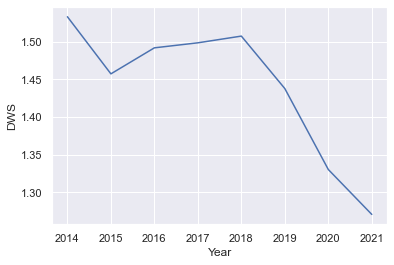

In [482]:
ax4 = sns.lineplot(x="Year", y="DWS",data=yearly)

And some additional analysis of the data looking at the linear relationships between different variables and Win Share now that I've culled the data somewhat.  It does look much cleaner now. 

/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/anaconda3/lib/python3.8/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/opt/anaconda3/lib/pyt

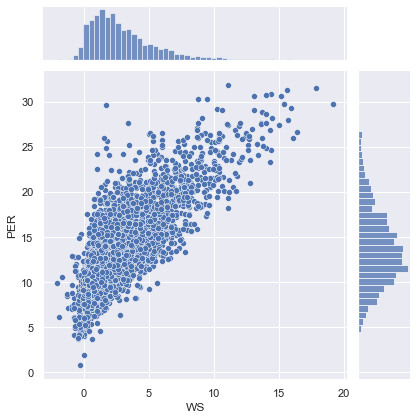

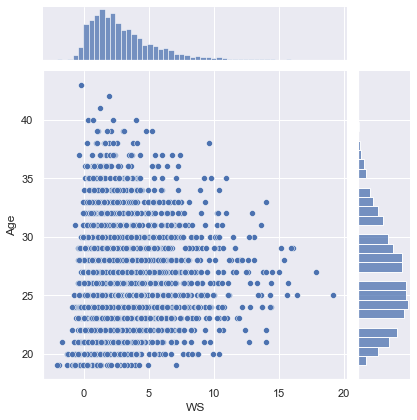

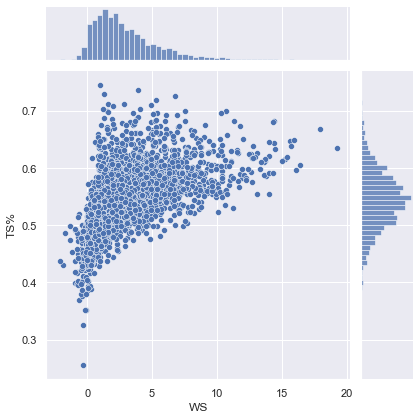

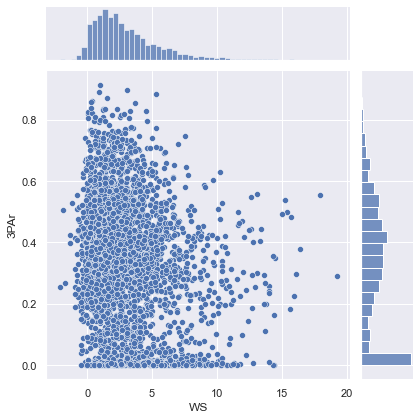

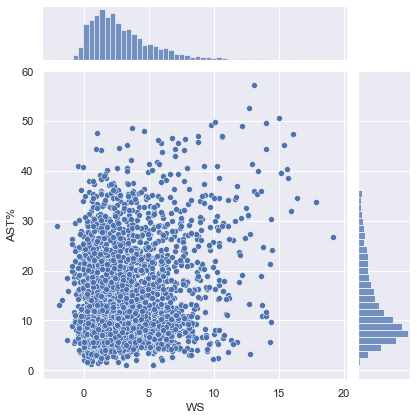

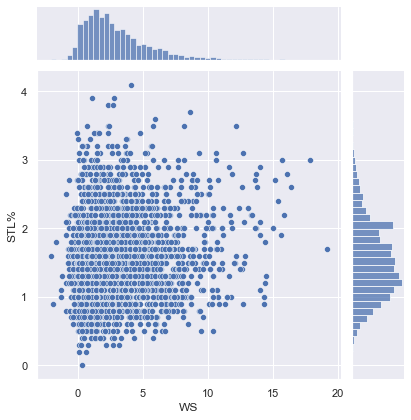

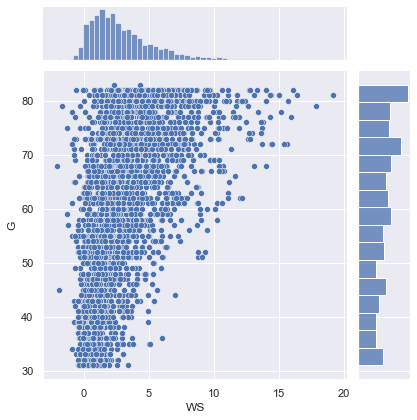

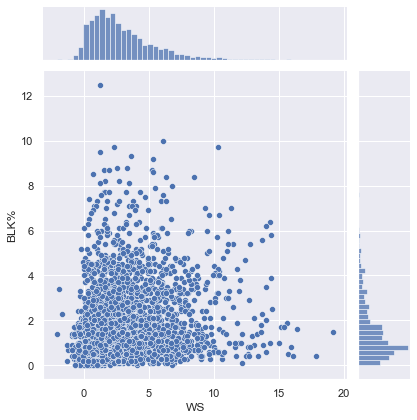

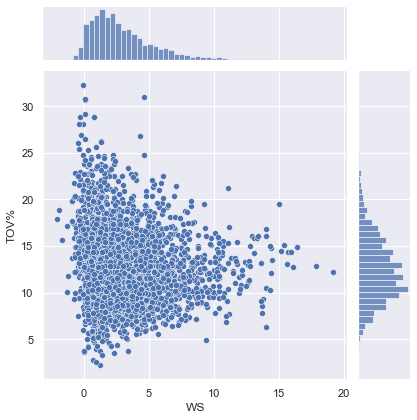

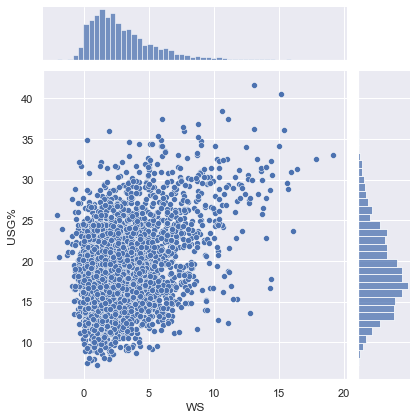

In [484]:
sns.jointplot(nd.WS, nd['PER'])
sns.jointplot(nd.WS, nd['Age'])
sns.jointplot(nd.WS, nd['TS%'])
sns.jointplot(nd.WS, nd['3PAr'])
sns.jointplot(nd.WS, nd['AST%'])
sns.jointplot(nd.WS, nd['STL%'])
sns.jointplot(nd.WS, nd['G'])
sns.jointplot(nd.WS, nd['BLK%'])
sns.jointplot(nd.WS, nd['TOV%'])
sns.jointplot(nd.WS, nd['USG%'])

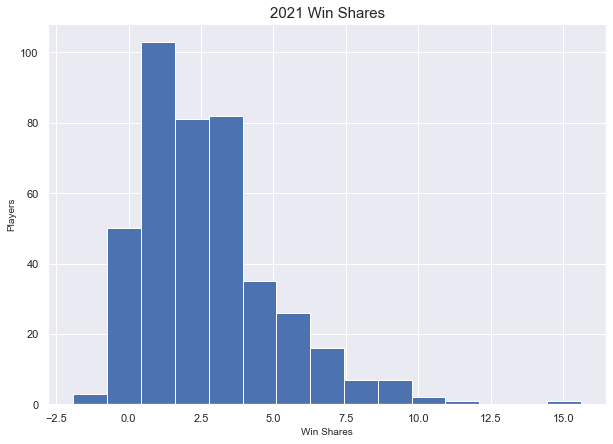

In [496]:
plt.figure(figsize = (10,7))
plt.hist(nd[ym2021]['WS'], bins = 15)
plt.xlabel('Win Shares', size = 10)
plt.ylabel('Players', size = 10)
plt.title('2021 Win Shares', size = 15);

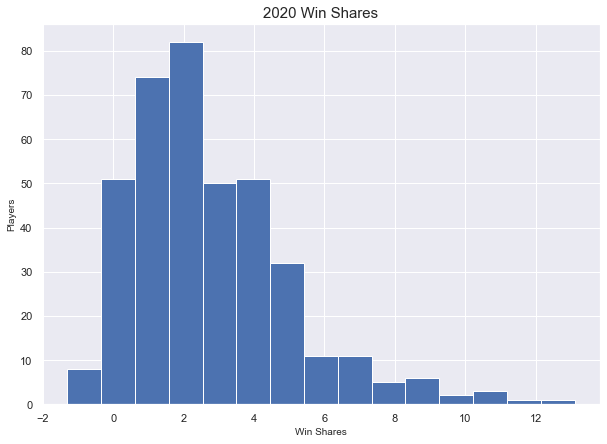

In [495]:
plt.figure(figsize = (10,7))
plt.hist(nd[ym2020]['WS'], bins = 15)
plt.xlabel('Win Shares', size = 10)
plt.ylabel('Players', size = 10)
plt.title('2020 Win Shares', size = 15);

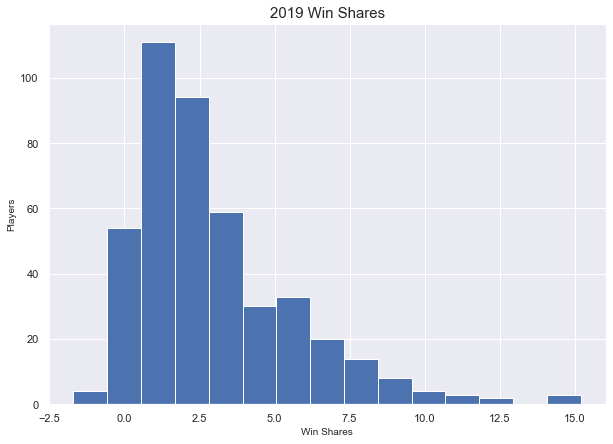

In [494]:
plt.figure(figsize = (10,7))
plt.hist(nd[ym2019]['WS'], bins = 15)
plt.xlabel('Win Shares', size = 10)
plt.ylabel('Players', size = 10)
plt.title('2019 Win Shares', size = 15);

At this point, I'm trying to just get a sense of what variables it would make sense to include in my model.  The next step for me is to set up a lag of Win Share so that I could beging to look to see if the previous years stats have any predictive power on Win Share at all.  From there, I'll begin building out the different training, vaidating and testing data sets.

# The Modeling Process: 1.) Determining Features

The first step was just to get a sense of what features were actually correlated with win shares.  So I ran some initial correlations.  This is with current win share.

In [521]:
cor = nd.corr()['WS']
print(cor)

index   -0.059526
Year    -0.053181
Age      0.079779
G        0.537968
MP       0.736295
PER      0.779891
TS%      0.550632
3PAr    -0.191804
FTr      0.334911
ORB%     0.192951
DRB%     0.292566
TRB%     0.278827
AST%     0.271324
STL%     0.128637
BLK%     0.174289
TOV%    -0.113023
USG%     0.394103
OWS      0.952505
DWS      0.804878
WS       1.000000
WS/48    0.807576
OBPM     0.791039
DBPM     0.345460
BPM      0.838163
VORP     0.917865
Name: WS, dtype: float64


I wanted to map this data out over time, just to see if there was anything to be gleaned from changes in the data over time, but didn't see anything off hand.  

In [504]:
cor2021 = nd[ym2021].corr()['WS']
cor2020 = nd[ym2020].corr()['WS']
cor2019 = nd[ym2019].corr()['WS']
cor2018 = nd[ym2018].corr()['WS']
cor2017 = nd[ym2017].corr()['WS']
cor2016 = nd[ym2016].corr()['WS']
cor2015 = nd[ym2015].corr()['WS']
cor2014 = nd[ym2014].corr()['WS']

In [518]:
corr = [cor2021, cor2020, cor2019, cor2018, cor2017, cor2016, cor2015, cor2014]
correlations = pd.concat(corr, axis = 1)

In [527]:
new_cor = correlations.T
new_cor.reset_index(inplace = True)

In [532]:
new_cor.drop(['level_0', 'index', 'Year'], axis = 1, inplace = True)

<AxesSubplot:>

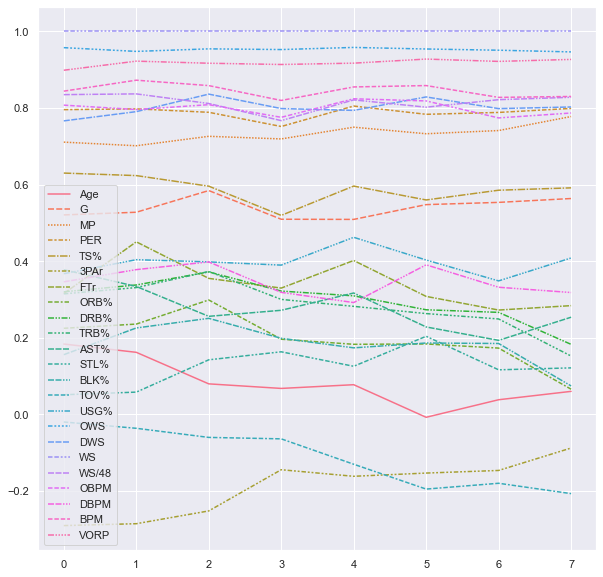

In [538]:
sns.set_theme(color_codes=True)
fig, ax = plt.subplots(figsize=(10,10)) 
sns.lineplot(data=new_cor, ax=ax)

Since I wanted to get a sense of if prior year's data would predict next year's win share, I needed to map the next year's win share to prior years data.

In [543]:
df1 = pd.DataFrame(nd[["Year", "Player", "WS", "WS/48"]])
df1["PrevYear"] =df1.Year - 1
df1.rename(columns={"WS": "PostWS", "WS/48": "PostWS/48"}, inplace = True)
df1.head()

,Year,Player,PostWS,PostWS/48,PrevYear
0,2021,Precious Achiuwa,1.3,0.085,2020
1,2021,Steven Adams,4.0,0.119,2020
2,2021,Bam Adebayo,8.8,0.197,2020
3,2021,Nickeil Alexander-Walker,0.7,0.035,2020
4,2021,Grayson Allen,2.7,0.101,2020


In [1283]:
df2 = pd.merge(nd, df1,  left_on=['Player', 'Year'], right_on = ['Player', 'PrevYear'])

And now I'm re-running the correlation data on the next year's win share.

In [859]:
df2_cor = df2.corr()['PostWS']
df2_cor.sort_values(ascending = False)
df3_cor = pd.DataFrame(df2_cor[3:25])
df3_cor.sort_values("PostWS", ascending=False, inplace = True)
df3_cor.reset_index()
df3_cor.rename(columns={"A": "Feature"})

,PostWS
WS,0.718461
VORP,0.695392
OWS,0.680248
BPM,0.640292
PER,0.626979
WS/48,0.595240
OBPM,0.590396
DWS,0.563878
MP,0.475683
USG%,0.358063


And here I graph out those correlations.  This would become a part of my presentation.

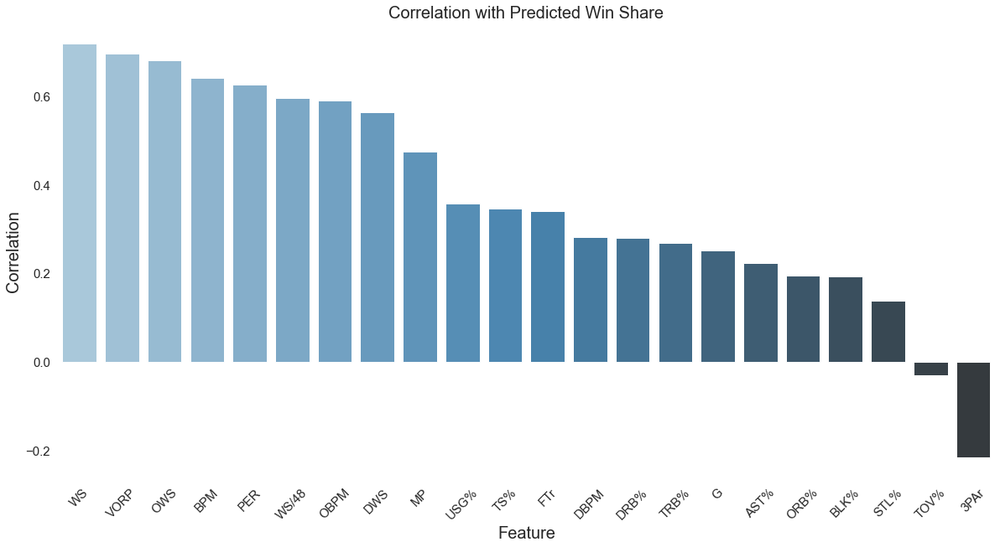

In [1271]:
sns.set_theme(style="white")
fig_dims = (20, 10)
fig, ax = plt.subplots(figsize=fig_dims)
sns.barplot(y=df3_cor.PostWS, x=df3_cor.index, ax=ax, palette="Blues_d", data=df3_cor)
#sns.set_palette("GnBu")
plt.title('Correlation with Predicted Win Share', size = 20);
plt.xlabel('Feature', size = 20)
plt.ylabel('Correlation', size = 20)
plt.xticks(rotation=45)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

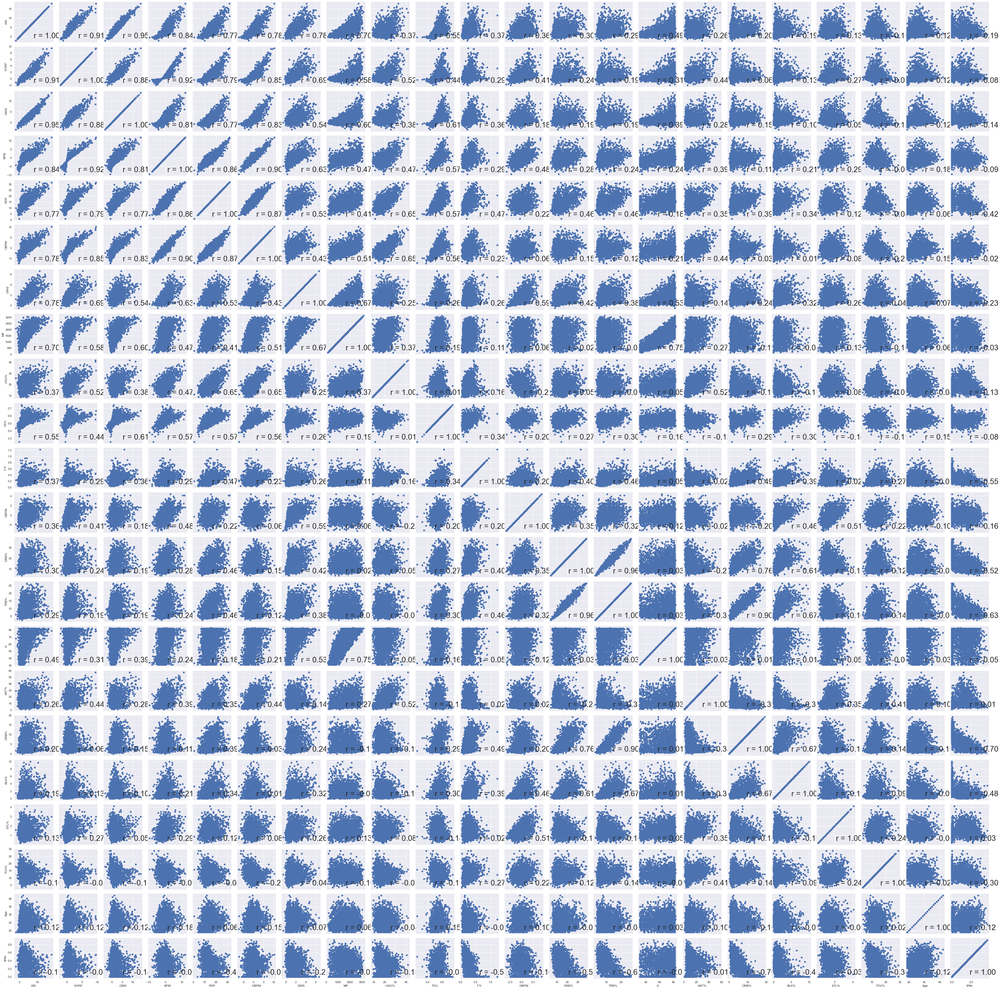

In [554]:
multi_corr = df2[['WS','VORP','OWS','BPM','PER','OBPM','DWS','MP','USG%','TS%','FTr', 'DBPM',
                 'DRB%', 'TRB%', 'G', 'AST%', 'ORB%', 'BLK%', 'STL%', 'TOV%', 'Age', '3PAr']]


def feature_corr(x, y, **kwargs):
    cor = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(cor),
                xy=(.5, .1),
                xycoords=ax.transAxes,
                size = 30)


plots = sns.PairGrid(multi_corr)
plots.map(plt.scatter)
plots.map(feature_corr);

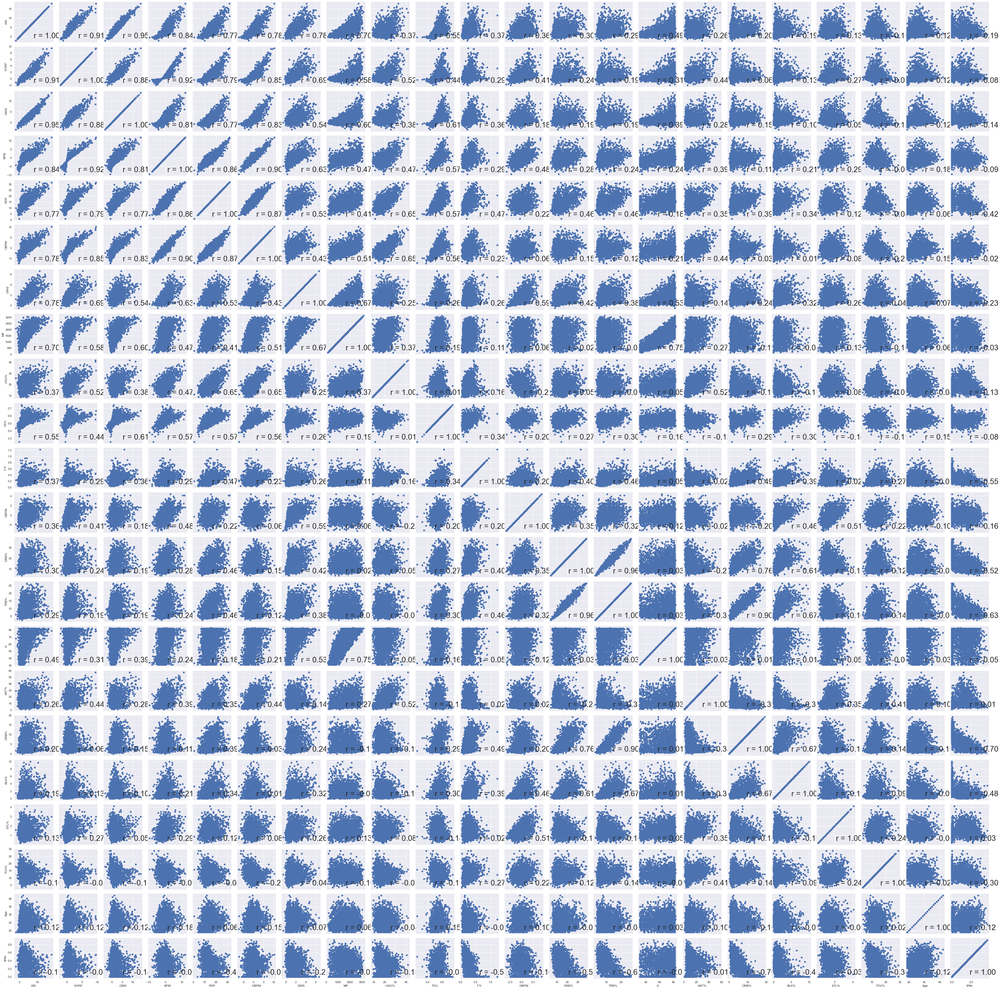

In [555]:
multi_corr2 = df2[['WS','MP','USG%','TS%','FTr', 'DBPM', 'DRB%', 'TRB%', 'G', 'AST%', 'ORB%', 'BLK%', 'STL%', 'TOV%', 'Age', '3PAr']]


def feature_corr(x, y, **kwargs):
    cor = np.corrcoef(x, y)[0][1]
    ax = plt.gca()
    ax.annotate("r = {:.2f}".format(cor),
                xy=(.5, .1),
                xycoords=ax.transAxes,
                size = 30)


plots = sns.PairGrid(multi_corr)
plots.map(plt.scatter)
plots.map(feature_corr);

# The Modeling Process: 2.) Running Initial Models

After having identified a few features that I'd like to look at in the modeling process, I begin running OLS regressions.

I iterate through about twelve different models to find one that I think is most reasonable.  

In [601]:
numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
ols_model = df2.select_dtypes(include=numerics)

In [622]:
import statsmodels.api as sm
x = df2[['WS','MP','USG%','TS%','FTr', 'DBPM', 'DRB%', 'TRB%', 'G', 'AST%', 'ORB%', 'BLK%', 'STL%']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
first_model = model.fit()
first_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.548
Method:                 Least Squares   F-statistic:                     236.1
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        14:00:06   Log-Likelihood:                -5052.6
No. Observations:                2524   AIC:                         1.013e+04
Df Residuals:                    2510   BIC:                         1.021e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.6537      0.656      4.047      0.000       1.368       3.939
WS             0.6721      0.031     21.584      0.000       0.611       0.733
MP             0.0003      0.000      2.749      0.006    9.94e-05       0.001
USG%           0.0407      0.011      3.684      0.000       0.019       0.062
TS%           -3.8658      1.004     -3.851      0.000      -5.834      -1.897
FTr            1.3172      0.353      3.727      0.000       0.624       2.010
DBPM           0.0328      0.068      0.483      0.629      -0.100       0.166
DRB%          -0.2466      0.145     -1.700      0.089      -0.531       0.038
TRB%           0.5235      0.292      1.790      0.074      -0.050       1.097
G             -0.0282      0.004     -6.724      0.000      -0.036      -0.020
AST%          -0.0027      0.006     -0.480      0.631      -0.014       0.008
ORB%          -0.2524      0.148     -1.707      0.088      -0.542       0.037
BLK%           0.0650      0.041      1.599      0.110      -0.015       0.145
STL%           0.1475      0.095      1.547      0.122      -0.039       0.334
==============================================================================
Omnibus:                      152.429   Durbin-Watson:                   1.799
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              260.567
Skew:                           0.464   Prob(JB):                     2.62e-57
Kurtosis:                       4.271   Cond. No.                     5.61e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.61e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [621]:
import statsmodels.api as sm
x = df2[['WS','MP','USG%','TS%','FTr', 'DRB%', 'TRB%', 'G', 'AST%', 'ORB%', 'BLK%', 'STL%']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
second_model = model.fit()
second_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.550
Model:                            OLS   Adj. R-squared:                  0.548
Method:                 Least Squares   F-statistic:                     255.8
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        14:00:01   Log-Likelihood:                -5052.7
No. Observations:                2524   AIC:                         1.013e+04
Df Residuals:                    2511   BIC:                         1.021e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.6399      0.655      4.031      0.000       1.356       3.924
WS             0.6783      0.028     23.932      0.000       0.623       0.734
MP             0.0003      0.000      2.715      0.007    9.21e-05       0.001
USG%           0.0379      0.009      4.036      0.000       0.019       0.056
TS%           -3.9210      0.997     -3.932      0.000      -5.876      -1.966
FTr            1.3184      0.353      3.730      0.000       0.625       2.011
DRB%          -0.2629      0.141     -1.864      0.062      -0.540       0.014
TRB%           0.5604      0.282      1.986      0.047       0.007       1.114
G             -0.0280      0.004     -6.711      0.000      -0.036      -0.020
AST%          -0.0024      0.006     -0.433      0.665      -0.013       0.008
ORB%          -0.2748      0.140     -1.958      0.050      -0.550       0.000
BLK%           0.0759      0.034      2.255      0.024       0.010       0.142
STL%           0.1796      0.068      2.627      0.009       0.046       0.314
==============================================================================
Omnibus:                      152.814   Durbin-Watson:                   1.799
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              261.681
Skew:                           0.465   Prob(JB):                     1.50e-57
Kurtosis:                       4.274   Cond. No.                     5.59e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.59e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [880]:
x = df2[['WS','VORP','OWS','BPM','PER','WS/48', 'OBPM', 'DBPM', 'DWS', 'MP']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
third_model = model.fit()
third_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.540
Model:                            OLS   Adj. R-squared:                  0.538
Method:                 Least Squares   F-statistic:                     295.2
Date:                Mon, 13 Sep 2021   Prob (F-statistic):               0.00
Time:                        18:15:20   Log-Likelihood:                -5080.3
No. Observations:                2524   AIC:                         1.018e+04
Df Residuals:                    2513   BIC:                         1.025e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.4126      0.397     -1.040      0.298      -1.190       0.365
WS            -0.6434      0.740     -0.869      0.385      -2.095       0.808
VORP           0.2304      0.154      1.498      0.134      -0.071       0.532
OWS            1.2898      0.739      1.744      0.081      -0.160       2.740
BPM           -0.1770      0.731     -0.242      0.809      -1.610       1.256
PER            0.1786      0.021      8.536      0.000       0.138       0.220
WS/48         -9.1531      3.113     -2.941      0.003     -15.257      -3.050
OBPM           0.0526      0.729      0.072      0.942      -1.377       1.482
DBPM           0.2868      0.731      0.392      0.695      -1.147       1.721
DWS            1.2152      0.739      1.643      0.100      -0.235       2.665
MP            -0.0002      0.000     -1.441      0.150      -0.001    7.68e-05
==============================================================================
Omnibus:                      171.732   Durbin-Watson:                   1.806
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              310.174
Skew:                           0.494   Prob(JB):                     4.43e-68
Kurtosis:                       4.405   Cond. No.                     1.48e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.48e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

It's pretty clear early on that with more features come more multi-collinearity.  It makes sense given my data set has metrics thare overlapping.

By cutting down on the features, I'm able to reduce the multi-collinearity without reducing the R^2 significantly.

In [618]:
x = df2[['WS','TS%', 'PER']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
fourth_model = model.fit()
fourth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.537
Model:                            OLS   Adj. R-squared:                  0.537
Method:                 Least Squares   F-statistic:                     974.9
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        13:59:44   Log-Likelihood:                -5088.4
No. Observations:                2524   AIC:                         1.018e+04
Df Residuals:                    2520   BIC:                         1.021e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.6897      0.456      5.904      0.000       1.796       3.583
WS             0.5978      0.021     27.980      0.000       0.556       0.640
TS%           -6.1884      0.917     -6.748      0.000      -7.987      -4.390
PER            0.1332      0.014      9.864      0.000       0.107       0.160
==============================================================================
Omnibus:                      176.803   Durbin-Watson:                   1.822
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              322.911
Skew:                           0.502   Prob(JB):                     7.60e-71
Kurtosis:                       4.435   Cond. No.                         441.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

I've noticed that the coefficient around True Shooting % is negative.  Leads me to a few questions about why that is.

In [641]:
x = df2[['WS','TS%']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
fifth_model = model.fit()
fifth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.519
Model:                            OLS   Adj. R-squared:                  0.519
Method:                 Least Squares   F-statistic:                     1362.
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        16:35:59   Log-Likelihood:                -5136.3
No. Observations:                2524   AIC:                         1.028e+04
Df Residuals:                    2521   BIC:                         1.030e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          2.7316      0.464      5.885      0.000       1.821       3.642
WS             0.7391      0.016     45.770      0.000       0.707       0.771
TS%           -3.6159      0.896     -4.036      0.000      -5.373      -1.859
==============================================================================
Omnibus:                      212.140   Durbin-Watson:                   1.823
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              374.563
Skew:                           0.594   Prob(JB):                     4.62e-82
Kurtosis:                       4.466   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [642]:
x = df2[['WS','PER']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
sixth_model = model.fit()
sixth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.529
Model:                            OLS   Adj. R-squared:                  0.528
Method:                 Least Squares   F-statistic:                     1415.
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        16:36:43   Log-Likelihood:                -5111.0
No. Observations:                2524   AIC:                         1.023e+04
Df Residuals:                    2521   BIC:                         1.025e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2251      0.146     -1.542      0.123      -0.511       0.061
WS             0.5692      0.021     26.945      0.000       0.528       0.611
PER            0.1073      0.013      8.216      0.000       0.082       0.133
==============================================================================
Omnibus:                      190.427   Durbin-Watson:                   1.815
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              335.337
Skew:                           0.546   Prob(JB):                     1.52e-73
Kurtosis:                       4.413   Cond. No.                         63.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [643]:
x = df2[['WS']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
seventh_model = model.fit()
seventh_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.516
Model:                            OLS   Adj. R-squared:                  0.516
Method:                 Least Squares   F-statistic:                     2691.
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        16:37:50   Log-Likelihood:                -5144.4
No. Observations:                2524   AIC:                         1.029e+04
Df Residuals:                    2522   BIC:                         1.030e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.8735      0.059     14.717      0.000       0.757       0.990
WS             0.7035      0.014     51.873      0.000       0.677       0.730
==============================================================================
Omnibus:                      215.984   Durbin-Watson:                   1.818
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              378.265
Skew:                           0.606   Prob(JB):                     7.26e-83
Kurtosis:                       4.459   Cond. No.                         7.25
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [652]:
x = df2[['USG%']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
eigth_model = model.fit()
eigth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.128
Model:                            OLS   Adj. R-squared:                  0.128
Method:                 Least Squares   F-statistic:                     370.9
Date:                Sat, 11 Sep 2021   Prob (F-statistic):           3.20e-77
Time:                        16:54:16   Log-Likelihood:                -5887.5
No. Observations:                2524   AIC:                         1.178e+04
Df Residuals:                    2522   BIC:                         1.179e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.3662      0.196     -1.870      0.062      -0.750       0.018
USG%           0.1881      0.010     19.259      0.000       0.169       0.207
==============================================================================
Omnibus:                      481.639   Durbin-Watson:                   1.820
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1000.858
Skew:                           1.113   Prob(JB):                    4.64e-218
Kurtosis:                       5.136   Cond. No.                         79.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [653]:
x = df2[['TS%']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
ninth_model = model.fit()
ninth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.120
Model:                            OLS   Adj. R-squared:                  0.119
Method:                 Least Squares   F-statistic:                     343.4
Date:                Sat, 11 Sep 2021   Prob (F-statistic):           5.66e-72
Time:                        16:56:01   Log-Likelihood:                -5899.6
No. Observations:                2524   AIC:                         1.180e+04
Df Residuals:                    2522   BIC:                         1.181e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -7.0164      0.558    -12.575      0.000      -8.110      -5.922
TS%           18.8045      1.015     18.531      0.000      16.815      20.794
==============================================================================
Omnibus:                      596.458   Durbin-Watson:                   1.835
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             1433.294
Skew:                           1.294   Prob(JB):                         0.00
Kurtosis:                       5.633   Cond. No.                         26.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [654]:
x = df2[['PER']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
tenth_model = model.fit()
tenth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.393
Model:                            OLS   Adj. R-squared:                  0.393
Method:                 Least Squares   F-statistic:                     1634.
Date:                Sat, 11 Sep 2021   Prob (F-statistic):          8.15e-276
Time:                        16:56:32   Log-Likelihood:                -5430.4
No. Observations:                2524   AIC:                         1.086e+04
Df Residuals:                    2522   BIC:                         1.088e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -2.2302      0.143    -15.648      0.000      -2.510      -1.951
PER            0.3795      0.009     40.417      0.000       0.361       0.398
==============================================================================
Omnibus:                      236.927   Durbin-Watson:                   1.798
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              423.930
Skew:                           0.645   Prob(JB):                     8.80e-93
Kurtosis:                       4.538   Cond. No.                         52.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [655]:
x = df2[['PER', 'WS']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
tenth_model = model.fit()
tenth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.529
Model:                            OLS   Adj. R-squared:                  0.528
Method:                 Least Squares   F-statistic:                     1415.
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        16:56:49   Log-Likelihood:                -5111.0
No. Observations:                2524   AIC:                         1.023e+04
Df Residuals:                    2521   BIC:                         1.025e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const         -0.2251      0.146     -1.542      0.123      -0.511       0.061
PER            0.1073      0.013      8.216      0.000       0.082       0.133
WS             0.5692      0.021     26.945      0.000       0.528       0.611
==============================================================================
Omnibus:                      190.427   Durbin-Watson:                   1.815
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              335.337
Skew:                           0.546   Prob(JB):                     1.52e-73
Kurtosis:                       4.413   Cond. No.                         63.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [675]:
x = df2[['VORP', 'WS']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
eleventh_model = model.fit()
eleventh_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.525
Model:                            OLS   Adj. R-squared:                  0.525
Method:                 Least Squares   F-statistic:                     1395.
Date:                Sat, 11 Sep 2021   Prob (F-statistic):               0.00
Time:                        17:05:13   Log-Likelihood:                -5120.4
No. Observations:                2524   AIC:                         1.025e+04
Df Residuals:                    2521   BIC:                         1.026e+04
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          1.1963      0.075     15.967      0.000       1.049       1.343
VORP           0.4546      0.065      6.953      0.000       0.326       0.583
WS             0.4930      0.033     14.885      0.000       0.428       0.558
==============================================================================
Omnibus:                      199.497   Durbin-Watson:                   1.811
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              359.822
Skew:                           0.559   Prob(JB):                     7.34e-79
Kurtosis:                       4.474   Cond. No.                         12.2
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

After iterating multiple times, I settle on the twelfth model as all the features are signficant.

In [967]:
x = df2[['VORP', 'WS', 'PER']]
x = sm.add_constant(x)
y = df2['PostWS']
model = sm.OLS(y,x, data = df2)
twelfth_model = model.fit()
twelfth_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 PostWS   R-squared:                       0.533
Model:                            OLS   Adj. R-squared:                  0.532
Method:                 Least Squares   F-statistic:                     957.1
Date:                Mon, 13 Sep 2021   Prob (F-statistic):               0.00
Time:                        20:50:46   Log-Likelihood:                -5100.9
No. Observations:                2524   AIC:                         1.021e+04
Df Residuals:                    2520   BIC:                         1.023e+04
Df Model:                           3                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const          0.2082      0.174      1.195      0.232      -0.133       0.550
VORP           0.3107      0.069      4.514      0.000       0.176       0.446
WS             0.4514      0.034     13.460      0.000       0.386       0.517
PER            0.0865      0.014      6.269      0.000       0.059       0.114
==============================================================================
Omnibus:                      183.607   Durbin-Watson:                   1.810
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              330.430
Skew:                           0.523   Prob(JB):                     1.77e-72
Kurtosis:                       4.431   Cond. No.                         77.7
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [1030]:
newchart = {"13 Factor Model": [first_model.rsquared.round(2), first_model.rsquared_adj.round(2)],
            "10 Factor Model": [third_model.rsquared.round(2), third_model.rsquared_adj.round(2)],
            "3 Factor Model": [twelfth_model.rsquared.round(2), fourth_model.rsquared_adj.round(2)],
            "TS%": [ninth_model.rsquared.round(2), eleventh_model.rsquared_adj.round(2)]
           }
print(newchart)

{'13 Factor Model': [0.55, 0.55], '10 Factor Model': [0.54, 0.54], '3 Factor Model': [0.53, 0.54], 'TS%': [0.12, 0.52]}


In [1031]:
nextchart = pd.DataFrame.from_dict(newchart, orient = 'index')
#df3_cor.rename(columns={"A": "Feature"})

#rsquared.head()

In [1032]:
nextchart.reset_index(inplace = True)
#nextchart.head()
nextchart.rename(columns = {0: 'Rsquared', 1: 'Adj_Rsquared'}, inplace=True)
nextchart.head()

,index,Rsquared,Adj_Rsquared
0,13 Factor Model,0.55,0.55
1,10 Factor Model,0.54,0.54
2,3 Factor Model,0.53,0.54
3,TS%,0.12,0.52


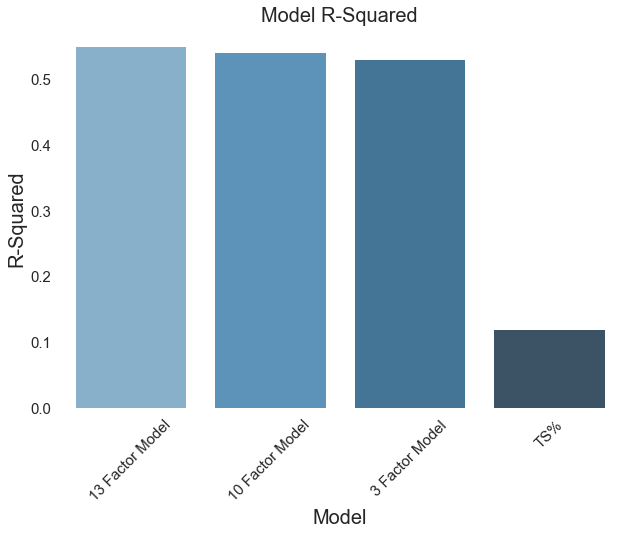

In [1270]:
sns.set_theme(style="white")
fig_dims = (10, 7)
fig, ax = plt.subplots(figsize=fig_dims)
ax = sns.barplot(x='index', y='Rsquared', ax=ax, data=nextchart, palette="Blues_d")
plt.title('Model R-Squared', size = 20);
plt.xlabel('Model', size = 20)
plt.ylabel('R-Squared', size = 20)
plt.xticks(rotation=45)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.spines['bottom'].set_visible(False)

#plt.xticks(rotation=45)

# The Modeling Process: 3.) Examining the residuals

In [630]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = first_model.model.exog
vif1 = [variance_inflation_factor(variables, i) 
       for i in range(variables.shape[1])]
large_model_vif = list(vif1)

In [629]:
from statsmodels.stats.outliers_influence import variance_inflation_factor
variables = fourth_model.model.exog
vif = [variance_inflation_factor(variables, i) 
       for i in range(variables.shape[1])]
small_model_vif = list(vif)
print(small_model_vif)

[158.44593042650746, 2.592273364603521, 1.5519665092106176, 2.709557166114504]


In [624]:
print(first_model.rsquared, second_model.rsquared, third_model.rsquared, fourth_model.rsquared)

0.5501260790539915 0.5500843331867604 0.5500507824565762 0.5371649604522281


In [633]:
def diagnostic_plot(x, y):
    plt.figure(figsize=(20,5))
    
    first_model = LinearRegression()
    rgr.fit(x,y)
    pred = rgr.predict(x)

    plt.subplot(1, 3, 1)
    plt.scatter(x,y)
    plt.plot(x, pred, color='blue',linewidth=1)
    plt.title("Regression fit")
    plt.xlabel("x")
    plt.ylabel("y")
    
    plt.subplot(1, 3, 2)
    res = y - pred
    plt.scatter(pred, res)
    plt.title("Residual plot")
    plt.xlabel("prediction")
    plt.ylabel("residuals")
    
    plt.subplot(1, 3, 3)
    #Generates a probability plot of sample data against the quantiles of a 
    # specified theoretical distribution 
    stats.probplot(res, dist="norm", plot=plt)
    plt.title("Normal Q-Q plot")

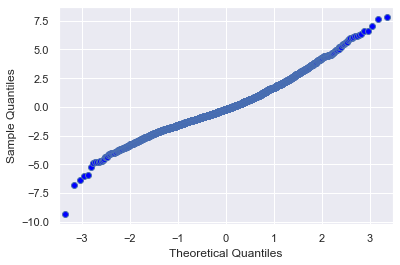

In [634]:
res = first_model.resid
fig = sm.qqplot(res)
plt.show()

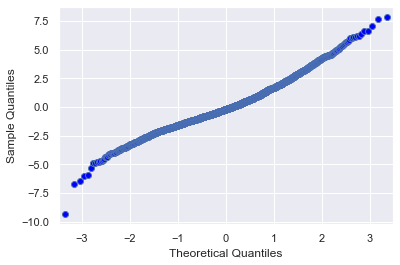

In [635]:
res = second_model.resid
fig = sm.qqplot(res)
plt.show()

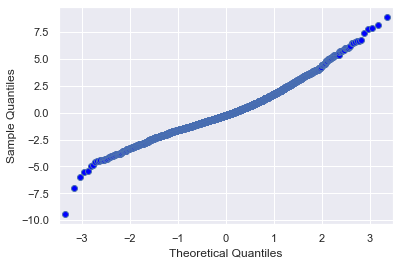

In [644]:
res = seventh_model.resid
fig = sm.qqplot(res)
plt.show()

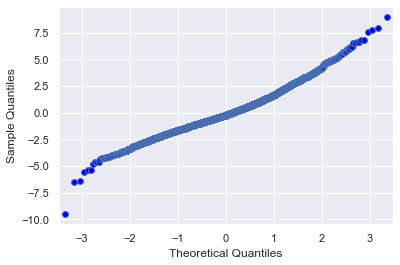

In [656]:
res = tenth_model.resid
fig = sm.qqplot(res)
plt.show()

# The Modeling Process: 4.) Training, Validating and Testing the Data

In [561]:
train, test = train_test_split(df2, test_size=0.25, random_state=99)

x_train = train[['WS','MP','USG%','TS%','FTr', 'DBPM', 'DRB%', 'TRB%', 'G', 'AST%', 'ORB%', 'BLK%', 'STL%']]
y_train = train[['PostWS']]

x_test = test[['WS','MP','USG%','TS%','FTr', 'DBPM', 'DRB%', 'TRB%', 'G', 'AST%', 'ORB%', 'BLK%', 'STL%']]
y_test = test[['PostWS']]

In [562]:
linReg = linear_model.LinearRegression()
linReg.fit(x_train, y_train)

linReg.predict(x_test)

y_lin_pred = linReg.predict(x_test)

print('Score:' % linReg.score(x_train, y_train))
print('Mean squared error:' % mean_squared_error(y_test, y_lin_pred))
print('Mean Absolute error:' % mean_absolute_error(y_test, y_lin_pred))
print('Variance score:' % r2_score(y_test, y_lin_pred))

Score: 0.559
Mean squared error: 3.386
Mean Absolute error: 1.399
Variance score: 0.519


In [573]:
train1, test1 = train_test_split(df2, test_size=0.25, random_state=99)

x_train1 = train1[['WS','MP','USG%','TS%','FTr', 'DRB%', 'TRB%', 'AST%', 'ORB%', 'BLK%', 'STL%']]
y_train1 = train1[['PostWS']]

x_test1 = test1[['WS','MP','USG%','TS%','FTr', 'DRB%', 'TRB%', 'AST%', 'ORB%', 'BLK%', 'STL%']]
y_test1 = test1[['PostWS']]

In [574]:
linReg = linear_model.LinearRegression()
linReg.fit(x_train1, y_train1)

linReg.predict(x_test1)

y_lin_pred1 = linReg.predict(x_test1)

print('Score: %.3f' % linReg.score(x_train1, y_train1))
print('Mean squared error: %.3f' % mean_squared_error(y_test1, y_lin_pred1))
print('Mean Absolute error: %.3f' % mean_absolute_error(y_test1, y_lin_pred1))
print('Variance score: %.3f' % r2_score(y_test1, y_lin_pred1))

Score: 0.551
Mean squared error: 3.444
Mean Absolute error: 1.415
Variance score: 0.511


At one point, I wanted to look at impact of position on the model, but I think I'll save that for the next iteration of this project.

In [572]:
c_mask = df2['Pos'] =='C'

,index,Year_x,Player,Pos,Age,Tm,G,MP,PER,TS%,...,WS,WS/48,OBPM,DBPM,BPM,VORP,Year_y,PostWS,PostWS/48,PrevYear
0,0,2020,Steven Adams,C,26.0,OKC,63.0,1680.0,20.5,0.604,...,6.5,0.185,1.9,1.1,2.9,2.1,2021,4.0,0.119,2020
4,6,2020,Jarrett Allen,C,21.0,BRK,70.0,1852.0,20.7,0.664,...,8.2,0.212,1.4,1.0,2.3,2.0,2021,6.4,0.166,2020
5,6,2020,Jarrett Allen,C,21.0,BRK,70.0,1852.0,20.7,0.664,...,8.2,0.212,1.4,1.0,2.3,2.0,2021,5.0,0.155,2020
13,23,2020,Deandre Ayton,C,21.0,PHO,38.0,1236.0,20.0,0.568,...,3.1,0.121,0.8,-0.4,0.4,0.7,2021,8.4,0.191,2020
16,27,2020,Mo Bamba,C,21.0,ORL,62.0,878.0,17.5,0.542,...,2.5,0.135,-1.2,1.6,0.4,0.5,2021,1.8,0.117,2020


In [575]:
train2, test2 = train_test_split(df2[c_mask], test_size=0.25, random_state=99)

x_train2 = train2[['WS','MP','USG%','TS%','FTr', 'DRB%', 'TRB%', 'AST%', 'ORB%', 'BLK%', 'STL%']]
y_train2 = train2[['PostWS']]

x_test2 = test2[['WS','MP','USG%','TS%','FTr', 'DRB%', 'TRB%', 'AST%', 'ORB%', 'BLK%', 'STL%']]
y_test2 = test2[['PostWS']]

In [576]:
linReg = linear_model.LinearRegression()
linReg.fit(x_train2, y_train2)

linReg.predict(x_test2)

y_lin_pred2 = linReg.predict(x_test2)

print('Score: %.3f' % linReg.score(x_train2, y_train2))
print('Mean squared error: %.3f' % mean_squared_error(y_test2, y_lin_pred2))
print('Mean Absolute error: %.3f' % mean_absolute_error(y_test2, y_lin_pred2))
print('Variance score: %.3f' % r2_score(y_test2, y_lin_pred2))

Score: 0.508
Mean squared error: 4.350
Mean Absolute error: 1.651
Variance score: 0.309


I started to play around the idea with dummy variables as well around position.  But didn't expolore it as much as I'd like.

In [596]:
import statsmodels.api as sm
y=nd.WS
x=pd.get_dummies(nd['Pos'], drop_first=True)
x['intercept'] =1
sm.OLS(y,x).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                     WS   R-squared:                       0.037
Model:                            OLS   Adj. R-squared:                  0.033
Method:                 Least Squares   F-statistic:                     9.591
Date:                Thu, 09 Sep 2021   Prob (F-statistic):           6.24e-20
Time:                        15:19:27   Log-Likelihood:                -7876.9
No. Observations:                3293   AIC:                         1.578e+04
Df Residuals:                    3279   BIC:                         1.587e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
C-PF          -1.3196      1.535     -0.860      0.390      -4.329       1.689
PF            -0.8024      0.148     -5.434      0.000      -1.092      -0.513
PF-C          -1.4363      1.088     -1.320      0.187      -3.569       0.696
PF-SF         -2.4624      1.008     -2.443      0.015      -4.438      -0.486
PG            -0.9213      0.148     -6.218      0.000      -1.212      -0.631
PG-SG         -0.4946      1.330     -0.372      0.710      -3.102       2.113
SF            -1.1056      0.153     -7.217      0.000      -1.406      -0.805
SF-PF         -2.1482      1.008     -2.131      0.033      -4.124      -0.172
SF-SG         -1.0640      0.890     -1.195      0.232      -2.809       0.681
SG            -1.5211      0.145    -10.523      0.000      -1.805      -1.238
SG-PF         -1.6196      2.654     -0.610      0.542      -6.823       3.584
SG-PG         -1.1696      1.088     -1.075      0.282      -3.302       0.963
SG-SF         -2.8053      1.008     -2.784      0.005      -4.781      -0.829
intercept      3.9196      0.106     37.042      0.000       3.712       4.127
==============================================================================
Omnibus:                     1004.901   Durbin-Watson:                   1.938
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             3070.643
Skew:                           1.565   Prob(JB):                         0.00
Kurtosis:                       6.547   Cond. No.                         62.0
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [699]:
train4, test4 = train_test_split(df2, test_size=0.25, random_state=99)

x_train4 = train4[['WS','VORP']]
y_train4 = train4[['PostWS']]

x_test4 = test4[['WS','VORP']]
y_test4 = test4[['PostWS']]

In [700]:
linReg4 = linear_model.LinearRegression()
linReg4.fit(x_train4, y_train4)

linReg4.predict(x_test4)

y_lin_pred4 = linReg4.predict(x_test4)

print('Score: %.3f' % linReg4.score(x_train4, y_train4))
print('Mean squared error: %.3f' % mean_squared_error(y_test4, y_lin_pred4))
print('Mean Absolute error: %.3f' % mean_absolute_error(y_test4, y_lin_pred4))
print('Variance score: %.3f' % r2_score(y_test4, y_lin_pred4))

Score: 0.534
Mean squared error: 3.532
Mean Absolute error: 1.431
Variance score: 0.498


In [970]:
train5, test5 = train_test_split(df2, test_size=0.25, random_state=99)

x_train5 = train5[['WS','VORP', 'PER']]
y_train5 = train5[['PostWS']]

x_test5 = test5[['WS','VORP', 'PER']]
y_test5 = test5[['PostWS']]

In [971]:
linReg5 = linear_model.LinearRegression()
linReg5.fit(x_train5, y_train5)

linReg5.predict(x_test5)

y_lin_pred5 = linReg5.predict(x_test5)

print('Score: %.3f' % linReg5.score(x_train5, y_train5))
print('Mean squared error: %.3f' % mean_squared_error(y_test5, y_lin_pred5))
print('Mean Absolute error: %.3f' % mean_absolute_error(y_test5, y_lin_pred5))
print('Variance score: %.3f' % r2_score(y_test5, y_lin_pred5))

Score: 0.540
Mean squared error: 3.461
Mean Absolute error: 1.417
Variance score: 0.509


In [ ]:
train3, test3 = train_test_split(df2, test_size=0.25, random_state=99)

x_train3 = train3[['WS','TS%', 'PER']]
y_train3 = train3[['PostWS']]

x_test3 = test3[['WS','TS%', 'PER']]
y_test3 = test3[['PostWS']]

In [965]:
linReg = linear_model.LinearRegression()
linReg.fit(x_train3, y_train3)

linReg.predict(x_test3)

y_lin_pred3 = linReg.predict(x_test3)

print('Score: %.3f' % linReg.score(x_train3, y_train3))
print('Mean squared error: %.3f' % mean_squared_error(y_test3, y_lin_pred3))
print('Mean Absolute error: %.3f' % mean_absolute_error(y_test3, y_lin_pred3))
print('Variance score: %.3f' % r2_score(y_test3, y_lin_pred3))

Score: 0.546
Mean squared error: 3.445
Mean Absolute error: 1.416
Variance score: 0.511


# The Modeling Process: 5.) Predicting Win Share

From here, I worked on predicting win shares as a way to validate the model.  Compare what I predicted vs. what actually happened in the model.

In [972]:
permodel = pd.DataFrame(nd[["WS", "VORP", 'PER']])
permodel.head()

,WS,VORP,PER
0,1.3,-0.5,14.2
1,4.0,0.5,15.1
2,8.8,3.6,22.7
3,0.7,0.1,12.5
4,2.7,0.5,12.8


In [973]:
per_pred = linReg5.predict(permodel)

In [974]:
permodel["PredWS"] = linReg5.predict(permodel)
permodel.head()

,WS,VORP,PER,PredWS
0,1.3,-0.5,14.2,1.846040
1,4.0,0.5,15.1,3.504220
2,8.8,3.6,22.7,7.290117
3,0.7,0.1,12.5,1.570974
4,2.7,0.5,12.8,2.679737


In [975]:
permodel1=pd.DataFrame(nd[["Year", "Player", "Pos", "Tm"]])

In [976]:
permodel2 = pd.merge(permodel1, permodel, left_index = True, right_index = True)
permodel2.head()

,Year,Player,Pos,Tm,WS,VORP,PER,PredWS
0,2021,Precious Achiuwa,PF,MIA,1.3,-0.5,14.2,1.846040
1,2021,Steven Adams,C,NOP,4.0,0.5,15.1,3.504220
2,2021,Bam Adebayo,C,MIA,8.8,3.6,22.7,7.290117
3,2021,Nickeil Alexander-Walker,SG,NOP,0.7,0.1,12.5,1.570974
4,2021,Grayson Allen,SG,MEM,2.7,0.5,12.8,2.679737


In [977]:
permodel3 = pd.DataFrame(permodel2[["Year", "Player", "PredWS"]])
permodel3["NextYear"] =df1.Year + 1
permodel3.rename(columns={"PredWS": "PrevPWS"}, inplace = True)
permodel3.head()

,Year,Player,PrevPWS,NextYear
0,2021,Precious Achiuwa,1.846040,2022
1,2021,Steven Adams,3.504220,2022
2,2021,Bam Adebayo,7.290117,2022
3,2021,Nickeil Alexander-Walker,1.570974,2022
4,2021,Grayson Allen,2.679737,2022


In [978]:
permodel4 = pd.merge(permodel2, permodel3, left_on = ['Player', 'Year'], right_on = ['Player', 'NextYear'])
permodel4.head()

,Year_x,Player,Pos,Tm,WS,VORP,PER,PredWS,Year_y,PrevPWS,NextYear
0,2021,Steven Adams,C,NOP,4.0,0.5,15.1,3.504220,2020,5.590083,2021
1,2021,Bam Adebayo,C,MIA,8.8,3.6,22.7,7.290117,2020,6.868187,2021
2,2021,Nickeil Alexander-Walker,SG,NOP,0.7,0.1,12.5,1.570974,2020,0.704637,2021
3,2021,Grayson Allen,SG,MEM,2.7,0.5,12.8,2.679737,2020,1.774874,2021
4,2021,Jarrett Allen,C,TOT,6.4,1.4,20.1,5.324478,2020,6.412413,2021


In [979]:
permodel4['PrevPWS'] = round(permodel4['PrevPWS'], 1)

In [981]:
permodel4["Diff"] = permodel4.WS - permodel4.PrevPWS

In [982]:
permodel4.Diff.describe()

count    2524.000000
mean        0.010737
std         1.825920
min        -9.700000
25%        -1.100000
50%        -0.200000
75%         1.000000
max         9.000000
Name: Diff, dtype: float64

And here I'm just graphing out some of the differences between my predictions and the actual data.

(array([  0., 100., 200., 300., 400., 500., 600., 700., 800., 900.]),
 [Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, ''),
  Text(0, 0, '')])

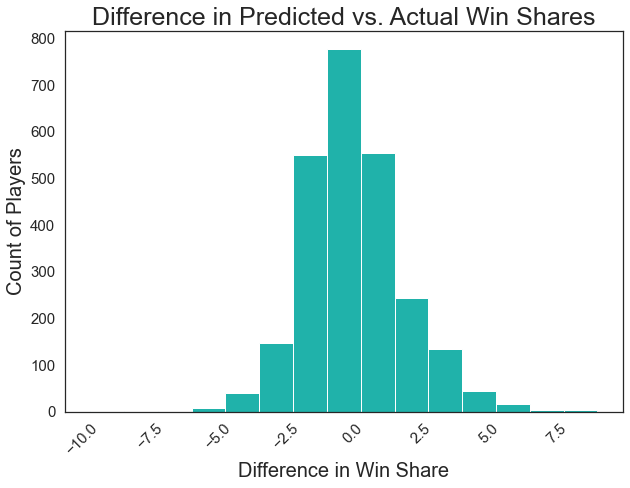

In [1281]:
sns.set_theme(style="white")
fig_dims = (10, 7)
fig, ax = plt.subplots(figsize=fig_dims)
ax = plt.hist(permodel4['Diff'], bins = 15, color='lightseagreen')
plt.xlabel('Diff', size = 10)
plt.ylabel('Players', size = 10)
plt.title('Difference in Predicted vs. Actual Win Shares', size = 25);
#plt.title('Correlation with Predicted Win Share', size = 20);
plt.xlabel('Difference in Win Share', size = 20)
plt.ylabel('Count of Players', size = 20)
plt.xticks(rotation=45)
plt.xticks(fontsize = 15)
plt.yticks(fontsize = 15)

In [984]:
permodel4.sort_values(["Diff"], ascending = False)

,Year_x,Player,Pos,Tm,WS,VORP,PER,PredWS,Year_y,PrevPWS,NextYear,Diff
1528,2017,Rudy Gobert,C,UTA,14.3,4.4,23.3,10.241986,2016,5.3,2017,9.0
2281,2015,Rudy Gobert,C,UTA,9.3,3.4,21.6,7.392404,2014,1.4,2015,7.9
818,2019,Rudy Gobert,C,UTA,14.4,4.8,24.6,10.502344,2018,6.5,2019,7.9
171,2021,Nikola Jokić,C,DEN,15.6,8.6,31.3,12.636176,2020,8.5,2021,7.1
2274,2015,Pau Gasol,PF,CHI,10.4,3.7,22.7,8.099694,2014,3.6,2015,6.8
...,...,...,...,...,...,...,...,...,...,...,...,...
80,2021,Anthony Davis,PF,LAL,3.7,1.9,22.1,4.297573,2020,9.3,2021,-5.6
2168,2015,Carmelo Anthony,SF,NYK,2.9,1.8,21.5,3.830589,2014,8.8,2015,-5.9
321,2021,Hassan Whiteside,C,SAC,0.9,-0.1,19.2,2.164136,2020,7.1,2021,-6.2
2463,2015,Lance Stephenson,SG,CHO,-0.9,-1.0,8.8,0.196101,2014,5.6,2015,-6.5


In [1285]:
permodel5 = pd.DataFrame(permodel4)
permodel5.sort_values(["Diff"], ascending = False, inplace = True)
permodel6 = permodel5.head(3)

This is where I noticed the Rudy Gobert was an outlier when it came to predicting win share.

In [1042]:
permodel8 = permodel4.copy()

In [1043]:
year_mask = permodel8['Year_x'] == 2021

In [1044]:
permodel9 = permodel8[year_mask]

In [1053]:
player = permodel4.groupby("Player").mean("Diff")

In [1286]:
player.sort_values("Diff", ascending = False)

,level_0,index,Player,Year_x,WS,VORP,PER,PredWS,Year_y,PrevPWS,NextYear,Diff
0,472,472,RJ Barrett,2021.0,4.100000,0.300000,13.400000,3.361626,2020.0,0.500000,2021.0,3.600000
1,500,500,Rudy Gobert,2018.0,10.642857,3.428571,21.842857,8.077180,2017.0,7.057143,2018.0,3.585714
2,410,410,Michael Porter Jr.,2021.0,6.900000,2.400000,20.600000,5.872917,2020.0,3.400000,2021.0,3.500000
3,440,440,Nikola Jokić,2019.0,11.520000,6.280000,26.640000,9.648110,2018.0,8.300000,2019.0,3.220000
4,411,411,Mikal Bridges,2020.5,6.400000,2.250000,14.650000,5.102236,2019.5,3.300000,2020.5,3.100000
...,...,...,...,...,...,...,...,...,...,...,...,...
608,175,175,Elton Brand,2015.0,0.700000,-0.100000,9.400000,1.264957,2014.0,3.200000,2015.0,-2.500000
609,280,280,Joakim Noah,2015.0,5.600000,2.100000,15.300000,4.724315,2014.0,8.700000,2015.0,-3.100000
610,396,396,Martell Webster,2015.0,0.000000,-0.300000,5.900000,0.583541,2014.0,3.800000,2015.0,-3.800000
611,509,509,Samuel Dalembert,2015.0,0.300000,-0.100000,11.800000,1.265361,2014.0,4.100000,2015.0,-3.800000


In [1287]:
#player.reset_index(inplace = True)
#player.sort_values("Diff", ascending = False, inplace=True)
#player.drop('level_0', axis =1, inplace = True)
#player.reset_index(inplace = True)

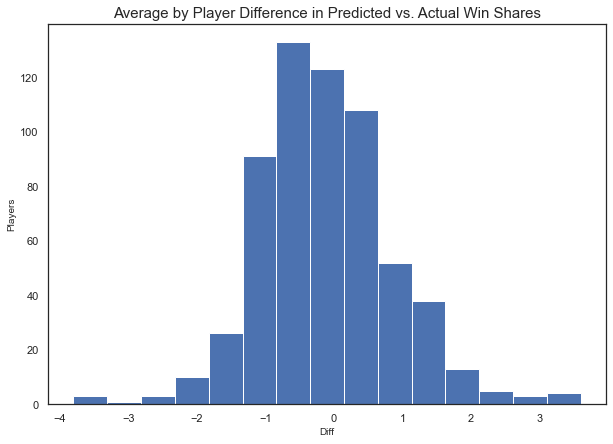

In [1066]:
sns.set_theme(style="white")
plt.figure(figsize = (10,7))
plt.hist(player['Diff'], bins = 15)
plt.xlabel('Diff', size = 10)
plt.ylabel('Players', size = 10)
plt.title('Average by Player Difference in Predicted vs. Actual Win Shares', size = 15);

In [1111]:
permodel9.loc[permodel9['Player'] == 'Marcus Smart']

,Year_x,Player,Pos,Tm,WS,VORP,PER,PredWS,Year_y,PrevPWS,NextYear,Diff
286,2021,Marcus Smart,PG,BOS,3.3,0.6,13.8,3.081514,2020,3.9,2021,-0.6


In [1190]:
permodel4.loc[permodel4['Player']=='James Harden']

,Year_x,Player,Pos,Tm,WS,VORP,PER,PredWS,Year_y,PrevPWS,NextYear,Diff
130,2021,James Harden,PG-SG,TOT,7.0,3.5,24.5,6.529800,2020,10.9,2021,-3.9
131,2021,James Harden,PG,BRK,6.0,3.0,25.0,5.949730,2020,10.9,2021,-4.9
475,2020,James Harden,SG,HOU,13.1,7.3,29.1,10.890785,2019,12.6,2020,0.5
835,2019,James Harden,PG,HOU,15.2,9.3,30.6,12.567062,2018,12.2,2019,3.0
1200,2018,James Harden,SG,HOU,15.4,7.7,29.8,12.179121,2017,11.9,2018,3.5
1543,2017,James Harden,PG,HOU,15.0,8.0,27.4,11.865901,2016,10.5,2017,4.5
1909,2016,James Harden,SG,HOU,13.3,6.8,25.3,10.546613,2015,12.5,2016,0.8
2295,2015,James Harden,SG,HOU,16.4,8.1,26.7,12.520332,2014,9.8,2015,6.6


In [1189]:
permodel4.loc[permodel4['Player']=='Marcus Smart']

,Year_x,Player,Pos,Tm,WS,VORP,PER,PredWS,Year_y,PrevPWS,NextYear,Diff
286,2021,Marcus Smart,PG,BOS,3.3,0.6,13.8,3.081514,2020,3.9,2021,-0.6
646,2020,Marcus Smart,SG,BOS,4.5,1.6,13.8,3.931766,2019,4.2,2020,0.3
1016,2019,Marcus Smart,SG,BOS,5.3,1.5,13.1,4.239904,2018,2.1,2019,3.2
1368,2018,Marcus Smart,SG,BOS,1.9,0.3,10.8,2.072009,2017,2.8,2018,-0.9
1716,2017,Marcus Smart,SG,BOS,3.2,0.4,12.0,2.832831,2016,2.6,2017,0.6
2084,2016,Marcus Smart,PG,BOS,2.9,0.4,11.3,2.628729,2015,2.7,2016,0.2


# Case Studies: Rudy Gobert and Marcus Smart

Here I did a deep dive into Marcus Smart and Rudy Gobert as a way to understand the value of the predictive model that I've built.

In [1133]:
Rudy_Gobert = nd.loc[nd["Player"] == 'Rudy Gobert']
Rudy_Gobert_stats = Rudy_Gobert[['Year','WS', "OWS", "DWS"]]
Rudy_Gobert_stats

,Year,WS,OWS,DWS
132,2021,11.3,6.1,5.2
552,2020,10.7,6.5,4.2
952,2019,14.4,8.7,5.7
1380,2018,8.1,4.2,3.9
1778,2017,14.3,8.3,6.0
2182,2016,6.4,2.6,3.8
2605,2015,9.3,5.0,4.3
3039,2014,0.4,-0.2,0.6


In [1171]:
#RG_Pred = permodel4.loc[permodel4["Player"] == 'Rudy Gobert']
#RG_Pred
#RGPred_stats = RG_Pred[['Year_x','WS', "PrevPWS", "Diff"]]
RGPred_stats.sort_values('Year_x', inplace=True)

<ipython-input-1171-229bbc3a682b>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  RGPred_stats.sort_values('Year_x', inplace=True)


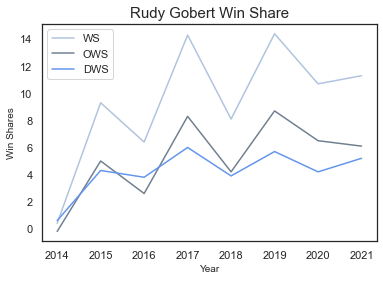

In [1177]:
import matplotlib.pyplot as plt
ax = plt.gca()
Rudy_Gobert_stats.plot(kind='line',x='Year',y='WS' , color = 'lightsteelblue',ax=ax)
Rudy_Gobert_stats.plot(kind='line',x='Year',y='OWS', color='slategrey', ax=ax)
Rudy_Gobert_stats.plot(kind='line',x='Year',y='DWS', color='cornflowerblue', ax=ax)
plt.title('Rudy Gobert Win Share', size = 15);
plt.xlabel('Year', size = 10)
plt.ylabel('Win Shares', size = 10)
plt.show()

<Figure size 720x504 with 0 Axes>

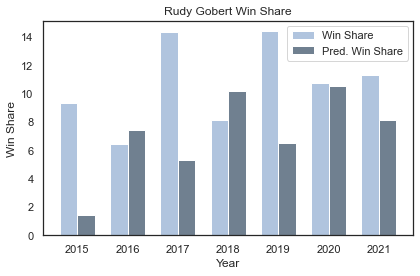

In [1179]:
x = np.arange(len(RGPred_stats.Year_x))  # the label locations
width = 0.35  # the width of the bars
plt.figure(figsize = (10,7))
fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, RGPred_stats.WS, width, label='Win Share', color = 'lightsteelblue')
rects2 = ax.bar(x + width/2, RGPred_stats.PrevPWS, width, label='Pred. Win Share', color = 'slategrey')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Win Share')
ax.set_xlabel('Year')
ax.set_title('Rudy Gobert Win Share')
ax.set_xticks(x)
ax.set_xticklabels(RGPred_stats.Year_x)
ax.legend()

#ax.bar_label(rects1, padding=3)
#ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()

In [1196]:
Marcus_Smart = nd.loc[nd["Player"] == 'Marcus Smart']
MS_stats = Marcus_Smart[['Year','WS', "OWS", "DWS"]]
MS_stats

,Year,WS,OWS,DWS
348,2021,3.3,1.8,1.5
752,2020,4.5,1.7,2.8
1185,2019,5.3,2.2,3.1
1583,2018,1.9,-0.6,2.5
1995,2017,3.2,0.5,2.7
2395,2016,2.9,0.5,2.4
2817,2015,2.9,0.7,2.2


In [1195]:
#MS_Pred = permodel4.loc[permodel4["Player"] == 'Marcus Smart']
#RG_Pred
#MSPred_stats = MS_Pred[['Year_x','WS', "PrevPWS", "Diff"]]
MSPred_stats.sort_values('Year_x', inplace=True)

<ipython-input-1195-a33377908301>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  MSPred_stats.sort_values('Year_x', inplace=True)


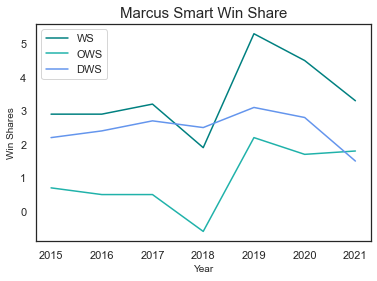

In [1208]:
import matplotlib.pyplot as plt
ax = plt.gca()
MS_stats.plot(kind='line',x='Year',y='WS' , color = 'teal',ax=ax)
MS_stats.plot(kind='line',x='Year',y='OWS', color='lightseagreen', ax=ax)
MS_stats.plot(kind='line',x='Year',y='DWS', color='cornflowerblue', ax=ax)
plt.title('Marcus Smart Win Share', size = 15);
plt.xlabel('Year', size = 10)
plt.ylabel('Win Shares', size = 10)
plt.show()

<Figure size 792x504 with 0 Axes>

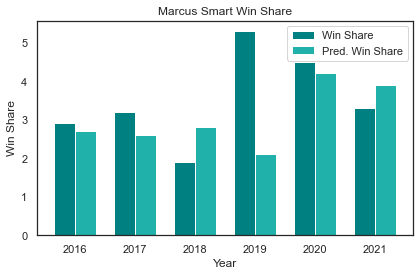

In [1207]:
x = np.arange(len(MSPred_stats.Year_x))  # the label locations
width = 0.35  # the width of the bars
plt.figure(figsize = (11,7))
fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, MSPred_stats.WS, width, label='Win Share', color = 'teal')
rects2 = ax.bar(x + width/2, MSPred_stats.PrevPWS, width, label='Pred. Win Share', color = 'lightseagreen')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Win Share')
ax.set_xlabel('Year')
ax.set_title('Marcus Smart Win Share')
ax.set_xticks(x)
ax.set_xticklabels(MSPred_stats.Year_x)
ax.legend()

#ax.bar_label(rects1, padding=3)
#ax.bar_label(rects2, padding=3)

fig.tight_layout()

plt.show()